<font size=25>Laboratory 2 summary</font>

In this lab you will:
* Learn how the `torch.autograd` package tracks the computation graph and performs backpropagation
* Solve Linear Regression by training a Single Layer Perceptron with Gradient Descent, using:
  - layer written without help from ```torch.nn``` [layers](https://pytorch.org/docs/stable/nn.html)
  - optimizer written from scratch
  - loss function written from scratch
* train neural networks using:
 - [layers](https://pytorch.org/docs/stable/nn.html#linear-layers) from the ```torch.nn``` package in PyTorch
 - [optimizer](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html#torch.optim.SGD) defined in PyTorch
 - [loss function](https://pytorch.org/docs/stable/nn.html#loss-functions) defined in PyTorch

# **Part I: Autograd**

## Computational Graph
The loss function (which contains the neural network output) can be seen as a very complex function. It can be decomposed into basic operations and viewed as a directed graph, where internal nodes are operations (functions) and the edges contain the tensors. 

|![Computational Graph](https://i.ibb.co/xX1kYvy/computational-graph.png)|
|:--:|
| Computational graph for simple linear neural network and SVM loss + regularization. [Source: CS231, lecture 4, slide 38](http://cs231n.stanford.edu/slides/2019/cs231n_2019_lecture04.pdf) |

To optimize $W$ using gradient descent, we need to compute the gradient of the loss $L_i$ with respect to $W$: $\nabla_{W}L_i$



## How to compute gradient
 - derive manually (difficult)
 - let software automatically compute the gradient using the computational graph and chain rule

|![Computational Graph](https://i.ibb.co/zr7TV4H/computational-graph.png)|
|:--:|
| Example of a simple computational graph. Autograd computes df/dx, df/dy, df/dz. [Source: CS231, lecture 4](http://cs231n.stanford.edu/slides/2019/cs231n_2019_lecture04.pdf) |

This procedure for finding derivatives of complex functions is called [automatic differentiation](https://en.wikipedia.org/wiki/Automatic_differentiation) (or autodiff). Backpropagation is a particular case of automatic differentiation (called reverse mode automatic differentiation), in which gradients are computed from the root to the leaves.


The [**torch.autograd**](https://pytorch.org/docs/stable/autograd.html) package provides automatic differentiation for all operations on Tensors. It is a *define-by-run* framework (the computational graph is *dynamic*), which means that your backprop is defined by how your code is run, and that every single iteration can be different (as opposed to TensorFlow, where you first define the graph and then run it - a *static graph*).

To track operations on a Tensor `x`, we need to set its attribute `requires_grad` to `True`. Calling `.backward()` on any output Tensor `y` will compute the gradients of `y` with respect to all leaves in the graph. The gradient for tensor `x` will be accumulated into the `.grad` attribute.

There’s one more class which is very important for autograd implementation - a `Function`. `Tensor` and `Function` are interconnected and build up an acyclic graph, that encodes a complete history of computation. Each tensor has a `.grad_fn` attribute that references a Function that has created the Tensor (except for Tensors created by the user - their `grad_fn` is `None`).

*Ref: [autograd](https://pytorch.org/tutorials/beginner/blitz/autograd_tutorial.html#sphx-glr-beginner-blitz-autograd-tutorial-py)*

## Viewing the computational graph

We can use `torchviz` to visualise the computation history. It displays the computation graph, coloring the leaf nodes in blue, the root (the element whose graph we are plotting in green), and all other intermediate operations in grey.

First we would need to install and import it in this notebook:

In [1]:
!pip install torchviz

In [1]:
from functools import partial
from IPython.display import HTML
import math
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import numpy as np
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchviz
from typing import Iterator


Let us define a simple Tensor, specifying the `requires_grad` parameter, and then draw the computation graph:

In [2]:
a = torch.ones(2, 2, requires_grad=True)
print(a)

tensor([[1., 1.],
        [1., 1.]], requires_grad=True)


In [3]:
b = torch.zeros(2, 2, requires_grad=True)
c = a + b
print("b = ", b)
print("c = ", c)

b =  tensor([[0., 0.],
        [0., 0.]], requires_grad=True)
c =  tensor([[1., 1.],
        [1., 1.]], grad_fn=<AddBackward0>)


Notice how the `grad_fn` attribute is now populated with `AddBackward0`. This means that `autograd` knows that the tensor `c` results from the addition operation between tensor `a` and `b`. To compute the gradients, autograd will traverse the computational graph from the root node (in this case, `c`) to its leaves (`a` and `b`).

Let's visualize the graph:

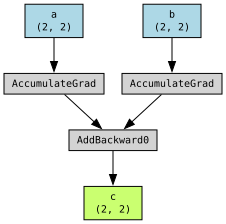

In [5]:
torchviz.make_dot(c, params={'a':a, 'b':b, 'c':c})

In [6]:
a.grad

Note that, had we not specified `requires_grad`, the computation history would not have been tracked.

c =  tensor([[1., 1.],
        [1., 1.]])


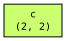

In [7]:
a = torch.ones(2, 2)
b = torch.zeros(2, 2)
c = a + b
print("c = ", c)
torchviz.make_dot(c, params={'a':a, 'b':b, 'c':c})

Let's look at another example, involving more tensors:

tensor(1.2706, grad_fn=<SumBackward0>)


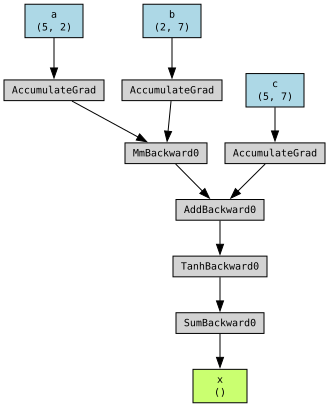

In [8]:
a = torch.randn(5, 2, requires_grad=True)
b = torch.randn(2, 7, requires_grad=True)
c = torch.randn(5, 7, requires_grad=True)

x = torch.tanh(a @ b + c).sum()

print(x)
torchviz.make_dot(x, params={'a':a, 'b':b, 'c':c, 'x':x})

## Computing the gradient of the result with respect to all tensors in the graph
Let's consider a simple dot product multiplication
 $y = \textbf{w}^T \textbf{x}$ and plot it's computational graph:

w = tensor([[0.4129],
        [0.2116],
        [0.6361]], requires_grad=True)
x = tensor([[10., 11., 12.]])
y = tensor([[14.0890]], grad_fn=<MmBackward0>)


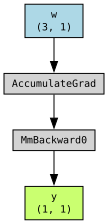

In [9]:
w = torch.rand([3,1], requires_grad=True)
x = torch.tensor([[10.0, 11.0, 12.0]])
y = x @ w # equivalent to y = torch.matmul(w, x)
print(f'w = {w}')
print(f'x = {x}')
print(f'y = {y}')
torchviz.make_dot(y, params={'w':w, 'x':x, 'y': y})

We compute the gradient of y with respect to **w**: $\nabla_
\textbf{w} y = [\frac{\partial y}{\partial w_1}, \frac{\partial y}{\partial w_2}, \frac{\partial y}{\partial w_3}] = [x_1, x_2, x_3] = \textbf{x}$

To do this in PyTorch, we simply call `backward()` on Tensor `y`:

In [10]:
y.backward()

The gradient of y with respect to **w** will be stored in `w.grad`:

In [11]:
print("Gradient of y wrt w = \n", w.grad)
print("Gradient of y wrt x = \n", x.grad)

Gradient of y wrt w = 
 tensor([[10.],
        [11.],
        [12.]])
Gradient of y wrt x = 
 None


What is the gradient of y with respect to **x** and why was it not stored in `x.grad`?

**Important:** Calling `.backward()` erases the forward graph by default. Calling `.backward()` again will raise an error.

In [12]:
try:
    y.backward()
except RuntimeError as e:
    print(e)

Trying to backward through the graph a second time (or directly access saved tensors after they have already been freed). Saved intermediate values of the graph are freed when you call .backward() or autograd.grad(). Specify retain_graph=True if you need to backward through the graph a second time or if you need to access saved tensors after calling backward.


## Exercise 1: Linear regression with autograd

Recall the linear regression exercise - in our previous lab we've trained our model by computing the closed-form solution. Let's do a linear regression using Gradient Descent.

We'd like to find the global minimum of the error function $E(w)$ - i.e. we want to find a *weight vector $w$* which minimizes $E(w)^{(*)}$.

Let $t$ be our iteration step. We want to perform *Gradient Descent* on the loss surface - the simplest approach to using gradient information is to update the weights by making small steps in the direction of the negative gradient (see Chapter 5.2 - Bishop) [[1]]: 

$$w^{(t+1)}=w^{(t)} - \eta\nabla_w E(w^{(t)})$$

The $\eta$ parameter is known as the *learning rate* and it represents the magnitude of the gradient step.

We're going to use the *Mean Squared Error (MSE)* loss for the Linear Regression. Recall that the MSE Loss is defined as follows:

$$MSE(\textbf{y}, \hat{\textbf{y}}) = \frac{1}{n} \sum_{i=0}^{n} (y_i - \hat{y_i})^2 $$

where $n$ is the dataset length, $\textbf{y}$ is the true label vector and $\hat{\textbf{y}}$ is the vector containing the predictions.

(\*): *In the context of Neural Networks, this won't be always possible (or desirable - recall the polynomial that was overfitting our data in the previous lab). The loss surface of a Neural Network is a lot more complex - there could be saddle points, parts of the surface with almost no gradients or highly irregular neighbours. We'll (usually) find a "good enough" local minima, improving our chances of finding it by using various optimization tehniques.*

[1]: http://users.isr.ist.utl.pt/~wurmd/Livros/school/Bishop%20-%20Pattern%20Recognition%20And%20Machine%20Learning%20-%20Springer%20%202006.pdf

**TODO:**

1) Implement the `__call__()` method of the `MSE` class. This method will compute the MSE Loss between predictions in `y` and ground-truth values in `target`

2) Implement the `forward()` method for the `GDLinearRegression` class. This method will predict our points w.r.t. the weights and biases.

3) Impement the `step()` method for the `GD` optimizer class. This method will perform a gradient descent update to the parameters.

4) Implement the `train()` routine:

- Make a prediction with your `GDLinearRegression` model.
- Calculate the MSE Loss using the `MSE` object.
- Calculate the gradients by using `.backward()` on the loss.
- Do an optimizer `.step()` and reset the gradients.


### Implement loss function

TODO: Implement the `__call__()` method of the `MSE` class below:

In [13]:
class MSE():
  """The Mean Squared Error loss"""
  
  def __call__(self, y: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
    """
    TODO: compute the MSE between predictions in tensor y and ground truth 
    values in tensor target. Both tensors are unidimensional.
    y: tensor of size N containing the predictions 
    target: tensor of size N containing the ground-truth values
    """
    mse = torch.sum((y-target) ** 2) / len(y)
    return mse

Let's test our loss function.

In [14]:
loss_criterion = MSE()
y = torch.tensor([1.0, 2, 3])
target = torch.tensor([2.0, 3, 4])
mse_loss = loss_criterion(y, target)
print("MSE loss = ", mse_loss)

MSE loss =  tensor(1.)


**Note:** Unless we design a very particular loss function, we do not write them from scratch but use the [loss functions](https://pytorch.org/docs/stable/nn.html#loss-functions) defined in the `torch.nn` package.

### Implement model

All models written in PyTorch need to subclass the [`nn.Module`](https://pytorch.org/docs/stable/generated/torch.nn.Module.html?highlight=module#torch.nn.Module) and implement the following methods:
1. `__init__` (the initialiser), where we initialise layers and activation functions
2. `forward`, which implements the feedforward step 

The constructor is already implemented. It initializes the model with the two parameters (weight and bias). The `w` and `b` Tensors are wrapped in the `nn.Parameter` class in order to be recognized as parameters by the `nn.Module`.

**TODO**: Implement the `forward` method:

In [15]:
class GDLinearRegression(nn.Module):
  """A simple Linear Regression model"""

  def __init__(self):
    super().__init__()
    # We initialize our model with random weights
    # nn.Parameter is just a wrapper over Tensor that tells `nn.Module` to 
    # register the object as a parameter. It creates a Tensor with
    # requires_grad=True by default
    self.w = nn.Parameter(torch.randn(1))
    self.b = nn.Parameter(torch.randn(1))

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    """
    TODO: implement feedforward call for a simple linear regression:
      y = wx + b
    Arguments: x is tensor of size (num_examples x 1)
    """
      # version 1
    y = x @ self.w + self.b 

    # version 2
    # y = x.matmul(w) + b
    return y

  # After each Gradient Descent step we should reset the gradients, 
  # otherwise they accumulate.

  # NOTE: this function is already provided by `nn.Module`
  # https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.zero_grad
  # However, we overwrite it below more simply so you understand what happens
  # behind the scenes
  def zero_grad(self):
    self.w.grad.zero_()
    self.b.grad.zero_()

The `nn.Module` class provides us with the `.parameters()` method, which conveniently return a list of all the model parameters (needed for optimization).

In [16]:
model = GDLinearRegression()
print(list(model.parameters()))

[Parameter containing:
tensor([0.7018], requires_grad=True), Parameter containing:
tensor([-1.0637], requires_grad=True)]


There is also the `.named_parameters()` method, which returns a dictionary that maps a parameter's name to its actual Tensor.

In [17]:
for name, p in model.named_parameters():
    print(name, "parameter: ", p)

w parameter:  Parameter containing:
tensor([0.7018], requires_grad=True)
b parameter:  Parameter containing:
tensor([-1.0637], requires_grad=True)


Let's feed some input `x` to the model. We do this by calling `model(x)`(which calls `model.forward(x)` underneath plus other hooks).

In [18]:
# batch of random 16 numbers
x = torch.rand(16, 1) 
y = model(x)
print(y)

tensor([-1.0494, -0.6870, -0.8833, -0.9396, -0.3846, -0.5463, -0.9310, -0.7398,
        -0.4437, -0.6379, -0.7917, -0.6441, -0.4050, -0.5165, -0.6383, -0.8284],
       grad_fn=<AddBackward0>)


### Implement optimizer
We write a simple Gradient Descent optimizer below. It takes the model parameters and learning rate as arguments. 

**TODO**: Implement the `step` function, which updates the parameters $w$ and $b$ using the current gradient of the loss (with respect to the parameters) and the learning rate $\eta$: 
$$w^{(t+1)}=w^{(t)} - \eta\nabla_wE(w^{(t)})$$
$$b^{(t+1)}=b^{(t)} - \eta\nabla_bE(b^{(t)})$$

Note: The `step` function assumes that `backprop` was already called and the gradients of the loss with respect to the parameters `w` and `b` are already computed.

In [19]:
class GD:
  """
  Gradient Descent optimizer
  We will write our own class for now, but in the future we will use
  the Optimizers implemented in Pytorch:
  https://pytorch.org/docs/stable/optim.html#torch.optim.Optimizer 
  """
  def __init__(self, params: Iterator[nn.Parameter], lr: int):
    self.w, self.b = list(params)
    self.lr = lr

    # We'll use these two for a plot :)
    if len(self.w.shape) == 1:
      self.w_hist = [self.w.item()]
      self.b_hist = [self.b.item()]

  def step(self):
    """
    TODO: Perform a gradient decent step. Update the parameters w and b by using:
     - the gradient of the loss with respect to the parameters
     - the learning rate
    This method is called after backward(), so the gradient of the loss wrt 
    the parameters is already computed (but where is it stored?)

    a.grad
    """
    with torch.no_grad():
      self.w -= self.w.grad * self.lr
      self.b -= self.b.grad * self.lr

    # We'll use these two for a plot :)
    if len(self.w.shape) == 1:
      self.w_hist.append(self.w.item())
      self.b_hist.append(self.b.item())

### Implement train routine

In [20]:
def train(model: GDLinearRegression, data: torch.Tensor, 
          target: torch.Tensor, optim: GD, criterion: MSE):
  """Linear Regression train routine"""
  # TODO pass: compute predictions
  predictions = model(data)
 
  # TODO forward pass: compute loss (hint: use criterion)
  loss = criterion(predictions, target)
 
  # TODO backpropagation: compute gradients of loss wrt weights
  loss.backward()
               
  # TODO gradient descent step: update weights using the previously computed
  # gradients (hint: use optim)
  optim.step()
 
  # TODO reset the gradients (hint: use model object)
  model.zero_grad()
  
  return model

Let's get some data and plot the *closed-form Linear Regressor*.

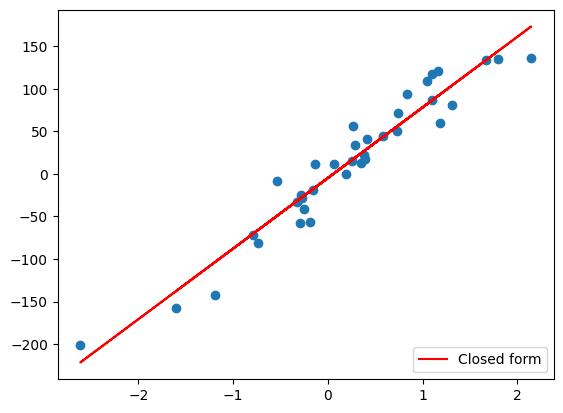

In [21]:
# number of dataset points
N = 36 #@param {type:"slider", min:10, max:100, step:1}

X, y, coef = make_regression(n_samples = N, n_features=1, noise=20, coef=True)
closed_form = LinearRegression().fit(X, y)
cf_prediction = closed_form.predict(X)
plt.scatter(X, y)
plt.plot(X, cf_prediction, color='red', label='Closed form')
plt.legend(loc='lower right')

X = torch.tensor(X).float()
y = torch.tensor(y).float()

Now let's plot the Linear Regressor obtained by Gradient Descent, at each optimization step.

Feel free to play with the learning rate and total optimization steps and see how the results compare.

What happens if you set a (very) big learning rate? (>1)

In [22]:
lr = 0.086 #@param {type: "slider", min: 0.001, max: 2, step: 0.005}
total_steps = 52 #@param {type:"slider", min: 0, max: 100, step: 1}

model = GDLinearRegression()
optimizer = GD(model.parameters(), lr=lr)
criterion = MSE()

fig, ax = plt.subplots()
plt.close()

gd_axis, = ax.plot([], [], label='Gradient Descent')
cf_axis, = ax.plot([], [], label='Closed Form')
legend = ax.legend(loc=2, prop={'size': 10})

def init():
  scatter = ax.scatter(X, y)
  cf_axis.set_data(X, cf_prediction)
  return (scatter, cf_axis,)

def train_and_plot(step: int):
  with torch.no_grad():
    y_pred = model(X)
  gd_axis.set_data(X, y_pred)
  
  train(model, X, y, optimizer, criterion)
  
  legend.texts[0].set_text(f"Gradient Descent (step={step})")
  legend.texts[1].set_text("Closed Form")

  return (gd_axis, legend, )

anim = animation.FuncAnimation(
    fig, train_and_plot, init_func=init, 
    frames=total_steps, interval=total_steps*2, blit=True
    )

rc('animation', html='jshtml')
anim

Let's see how the weight `w` and bias `b` changed after every Gradient Descent step.

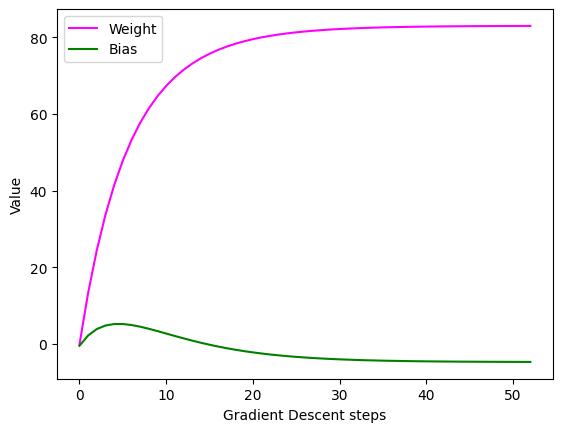

In [23]:
plt.plot(optimizer.w_hist, label='Weight', color='fuchsia')
plt.plot(optimizer.b_hist, label='Bias', color='green')
plt.xlabel('Gradient Descent steps')
plt.ylabel('Value')
plt.legend()

# Part II: Neural Networks, finally

In this section we will implement Neural Networks in PyTorch using predefined `nn.Linear` layers.

## Defining some clusters

We want to train a model that can learn to classify 2D points sampled from 2 clusters in a plane, for example:

![Plot showing the distribution](https://i.imgur.com/XwavfqU.png)

These clusters are 2D Normal Distributions, $\mathcal{N}(\boldsymbol{\mu}, \boldsymbol{\Sigma})$, where $\boldsymbol{\mu} \in \mathbb{R}^2$ defines the center of the distribution, and $\boldsymbol{\Sigma} \in \mathbb{R}^{2 \times 2}$ is a diagonal matrix containing the standard deviations over each direction. In other words, $\boldsymbol{\Sigma} = \text{diag}(\boldsymbol{\sigma^2})$, where $\sigma_i^2 \in [0, +\infty)$ for all $i = \overline{1, 2}$ (See Chapter 2.3 - Bishop) [[2]](https://en.wikipedia.org/wiki/Multivariate_normal_distribution). 

Let's first define a helper function that will help us plot our 2D data, along with a class that implements a `sample` and a `plot` method.

In [24]:
def plot_set(data: np.array, labels: np.array, alpha=1):
    """Helper function that plots labeled data"""
    plt.scatter(data[:,0], data[:,1], c=labels, cmap='Accent', alpha=alpha)

class LabeledDistribution:
    """This class represents a distribution over (example, label) pairs"""

    def sample(self, n: int) -> tuple:
        """Sample from the distribution"""
        raise NotImplementedError
        
    def plot(self, n: int = 1000):
        """Plot `n` values sampled from the distribution"""
        data, labels = self.sample(n)
        plot_set(data, labels.type(torch.float32))

Now let's define a class that helps us define and sample from clusters in a plane. In its initialiser, `mu`, `sigma` and `labels` are lists of the same length as the number of clusters. `mu[i]` and `sigma[i]` define a cluster of label `labels[i]`. In other words, they define a distribution $\mathcal{N}(\boldsymbol{\mu_i}, diag(\boldsymbol{\sigma_i}))$.

In [25]:
class Clusters(LabeledDistribution):
    """This class defines labeled normal-distributed clusters in a plane with diagonal covariance matrix"""
    def __init__(self, mu: list = [[-2, -2], [2, 2]], 
                       sigma: list = [[1, 1], [1, 1]],
                       labels: list = [0, 1]):
        self._mu = torch.tensor(mu)
        self._sigma = torch.tensor(sigma)
        self._labels = torch.tensor(labels).type(torch.long)

        self.no_cls = len(set(labels)) # the number of classes in our distribution
        self.no_clusters = self._mu.shape[0] # the number of clusters in our distribution
        
    def sample(self, n: int) -> tuple:
        data = torch.normal(torch.zeros(n, 2), torch.ones(n, 2)) # take n samples from a standard normal distribution
        cluster_idx = torch.randint(0, self.no_clusters, [n]) # randomly assign each observation to a cluster

        shifted_data = data * self._sigma[cluster_idx] + self._mu[cluster_idx] # transform each observation such that they are 
                                                                               # sampled from the distribution of the cluster
        labels = self._labels[cluster_idx] # get the label of each point by looking at the label of its cluster

        return shifted_data, labels

Now we can sample points from our clusters:

In [26]:
dist = Clusters()
points, labels = dist.sample(10)
for point, label in zip(points, labels):
    x = round(point[0].item(), 2)
    y = round(point[1].item(), 2)
    print(f'({x}, {y}) belongs to class {label}')

(-2.59, -1.19) belongs to class 0
(-3.21, -3.95) belongs to class 0
(-0.37, -1.2) belongs to class 0
(0.36, 3.79) belongs to class 1
(2.83, 2.8) belongs to class 1
(2.04, 2.55) belongs to class 1
(-2.15, -4.07) belongs to class 0
(-1.81, -1.68) belongs to class 0
(-1.99, -1.43) belongs to class 0
(-2.07, -0.61) belongs to class 0


Let's now plot our clusters to make sure we achieved what we wanted in the first place.

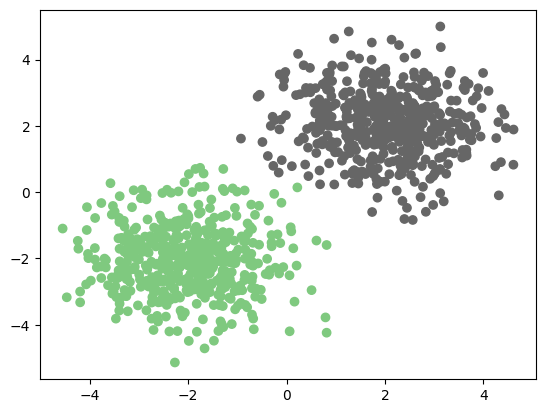

In [27]:
# We now have a distribution to sample from :)
dist = Clusters()
dist.plot()

## Single Layer Neural Network

### Model definition
Let's build a single layer perceptron as a Pytorch `nn.Module`:

$$f(\boldsymbol{x}) = \sigma(\boldsymbol{W} \boldsymbol{x} + \boldsymbol{b})$$

To build a Neural Network in Pytorch we subclass ``nn.Module`` and implement the following methods:
1. `__init__` (the initialiser), where we initialise our weights and biases, as well as define our activation function.
2. `forward`, which gets called under the hood when we run `model(...)`

The `nn.Module` class give us access to a range of methods, like:
 - `.forward()`, called when doing a forward pass
 - `.train()`, which puts the model in training mode 
 - `.eval()`, which puts the model in evaluation mode
 - `.zero_grad()`, which zeroes the gradients of all the model parameters 
 - `.parameters()`, which gives an iterable over all the model's parameters


### Using `nn.Module` (without predefined `nn` layers)
We manually construct our linear layer (weights $\boldsymbol{W}$ and bias $\boldsymbol{b}$) for didactic reasons.


In [28]:
class OneLayer(nn.Module):
  """
  Single-Layer Neural Network, without Pytorch nn.Linear Module
  """
  def __init__(self, 
               input_size: int, 
               output_size: int, 
               activation_fn = lambda x: torch.softmax(x,dim=-1)):
      super().__init__()

      # randomly initialise the weights with samples from a Gaussian distribution
      self._w = nn.Parameter(torch.randn([input_size, output_size]))

      # ... and the biases with zeros
      self._b = nn.Parameter(torch.zeros([1, output_size]))

      self._params = [self._w, self._b]
      
      # define the activation function
      self._activation_fn = activation_fn
      
  def forward(self, x: torch.Tensor) -> torch.Tensor:
      # σ(wx + b)
      return self._activation_fn(x @ self._w + self._b)

  def zero_grad(self):
      """Reset the gradients of the parameters"""
      for param in self._params:
          if param.grad is not None:
              param.grad.zero_()

### Using nn.Module with predefined layers
In practice, defining the Neural Networks layers and implementing them ourselves can get cumbersome. Therefore, we use predefined layers (linear, convolution, recurrent) and activations in the [`torch.nn`](https://pytorch.org/docs/stable/nn.html#torch.nn.Module) package.

For instance, instead of defining two parameters for the linear layer, we instantiate a [`nn.Linear`](https://pytorch.org/docs/stable/nn.html?highlight=nn%20linear#torch.nn.Linear) object, which takes the number of input features and output features. We then simply feed the input to the `Linear` object in the `forward()` method to get the output.

In [29]:
class OneLayer(nn.Module):
  """Single-Layer Neural Network using Pytorch nn.Linear"""
  def __init__(self, 
               input_size: int, 
               output_size: int, 
               activation_fn = lambda x: torch.softmax(x,dim=-1)):
      super().__init__()

      # we instantiate a Linear layer
      # look up nn.Linear in Pytorch documentation:
      #   https://pytorch.org/docs/stable/generated/torch.nn.Linear.html
      self.linear_tr = nn.Linear(
          in_features=input_size,
          out_features=output_size, 
          bias=True
      )
      
      # store the activation function
      self._activation_fn = activation_fn
      
  def forward(self, x: torch.Tensor) -> torch.Tensor:     
      # step 1: apply linear layer to x
      output = self.linear_tr(x)

      # step 2: apply softmax to output
      y = self._activation_fn(output)

      return y

With the hard part out of the way, we now just define two helper functions:
1. `plot_decision` simply plots the decision boundary given a model. it does that by predictiong the class every point in the plane
2. `plot_loss` simply plots the evolution of our loss function

In [30]:
def plot_decision(model: nn.Module, bounds: list = [-8, 8, -8, 8],
                  detail: int = 100):
    """Plot the decision boundary of the `model`"""

    # Get all the points in the region we want to plot
    x1, x2 = torch.meshgrid(torch.linspace(bounds[0], bounds[1], detail),
                            torch.linspace(bounds[2], bounds[3], detail))
    
    data = torch.cat((x1.contiguous().view(-1, 1), x2.contiguous().view(-1, 1)),
                     dim=1)
    
    # use the model to predict the class of every point
    labels = torch.argmax(model(data), dim=-1)

    # plot all of the points
    plot_set(data, labels, alpha=0.1)
    
def plot_loss(loss: list, label: str, color: str = 'blue'):
    """Plot the evolution of the loss function"""
    plt.plot(loss, label=label, color=color)
    plt.legend()

Let's now plot the computation graph of our network, using a `in_size` of 2 (the `x` and `y` coordinates of every point), and an `out_size` of 2 (the scores the model attributes to the point belonging to each of the 2 classes). To predict the class of the point, we will simply take the `argmax` over the output of the network.

We can see from the computation graph all the operations being performed using the weights and biases.

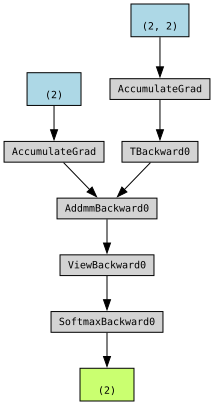

In [31]:
model = OneLayer(2,2)

x = torch.empty(2)
torchviz.make_dot(model(x))

Let's now plot the decision boundary of our randomly initialized model. Unless you are very lucky, the model won't explain the data very well:

/Users/dtantaru/miniforge3/envs/ncu/lib/python3.10/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3638.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


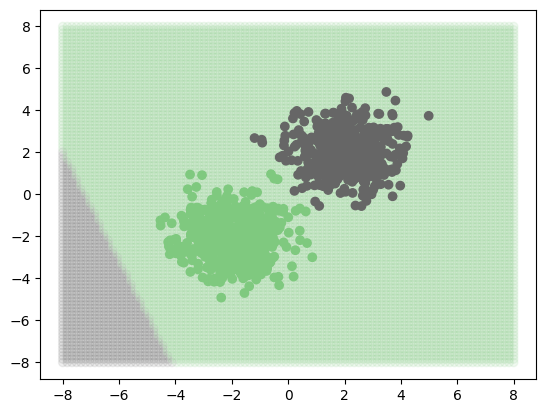

In [32]:
plot_decision(model)
dist.plot()

### Model training
It's finally time to train our model! First let's generate a sample from our distribution to use as training data.

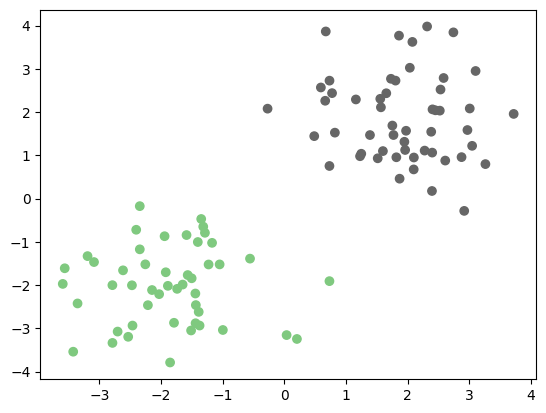

In [33]:
train_data, train_labels = dist.sample(100)
plot_set(train_data, train_labels)

Now let's define the loss function that we will use to train our model. We will manually define the Negative Log-Likelihood - NLL (though, in practice, this is already implemented in PyTorch).

The network outputs a tensor $\boldsymbol{p} = (p_1, p_2)$, representing the class likelihoods of each of the two classes. Let $p_i \in [0, 1]$ be the class score of the correct class. Then the NLL is defined as:
$$ \text{NLL} (\boldsymbol{p}) = - \log p_i $$

When calculating the loss over the whole data, we will simply compute the mean of the losses over every point.

In [34]:
def NLL(output: torch.Tensor, true_labels: torch.Tensor) -> torch.Tensor:
    """
    Given the predictions of the neural network and the ground truth data,
    compute the negative log-likelihood.
    Arguments:
      output: output of neural network, tensor of size N x 2
      true_labels: ground truth data, Tensor of size N
    """
    # get the likelihoods of the correct class for all predictions
    likelihood = output.gather(1, true_labels.view(-1,1))

    # calculate the mean of loss
    loss = -torch.log(likelihood)
    loss = torch.mean(loss)

    return loss

EPOCH 0:
loss = 0.9695218801498413


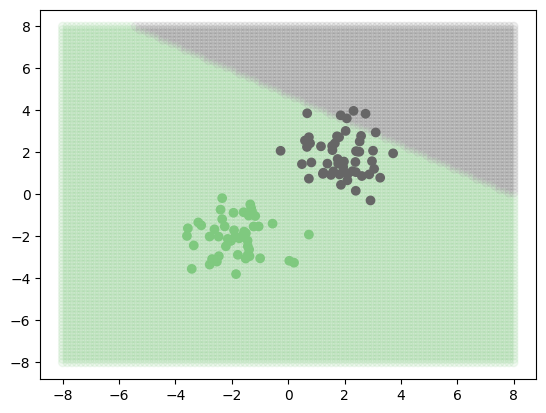

EPOCH 5:
loss = 0.18237820267677307


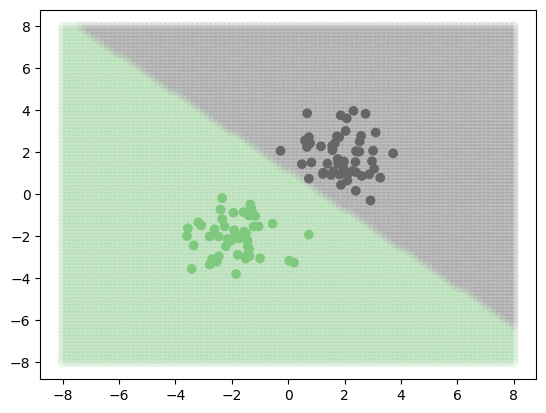

EPOCH 10:
loss = 0.1020841971039772


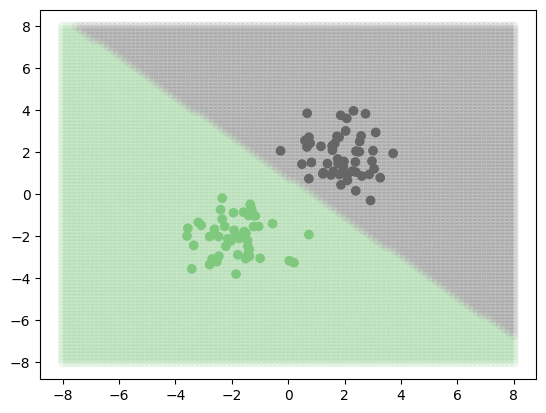

EPOCH 15:
loss = 0.07243195176124573


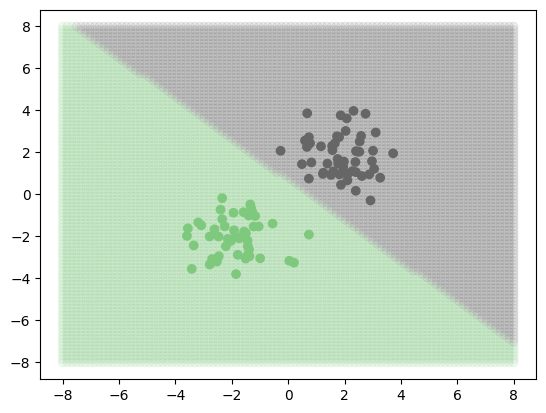

EPOCH 20:
loss = 0.05679014325141907


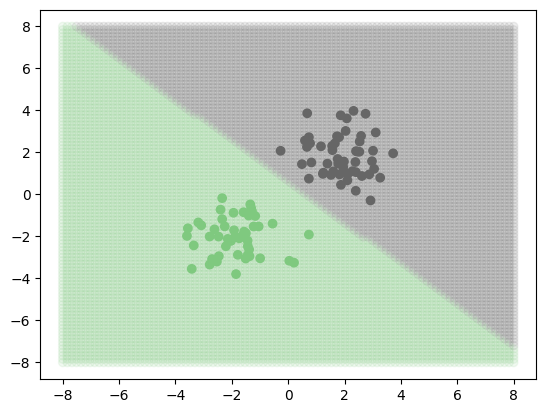

EPOCH 25:
loss = 0.04704565554857254


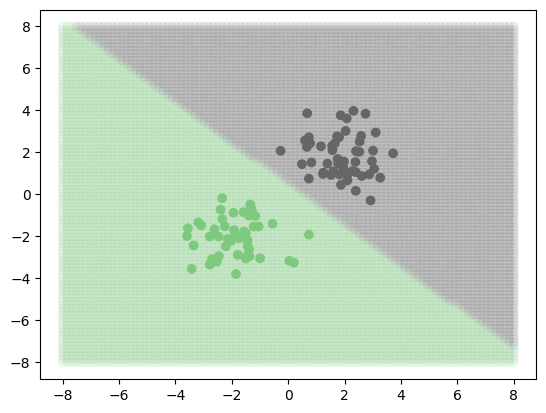

EPOCH 30:
loss = 0.040355000644922256


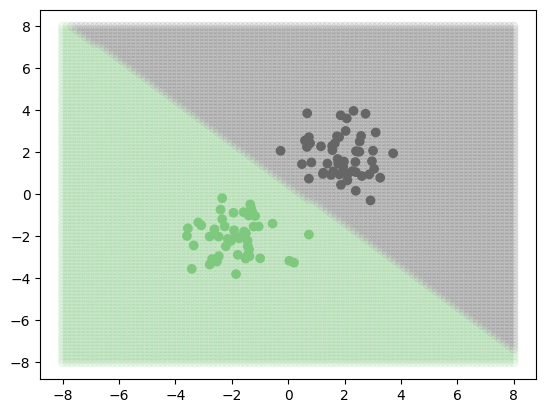

EPOCH 35:
loss = 0.03545740619301796


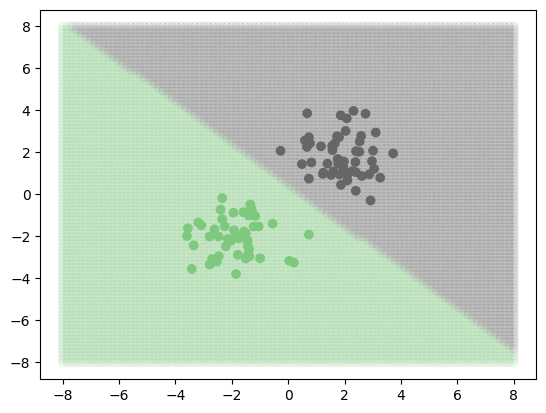

EPOCH 40:
loss = 0.03170586749911308


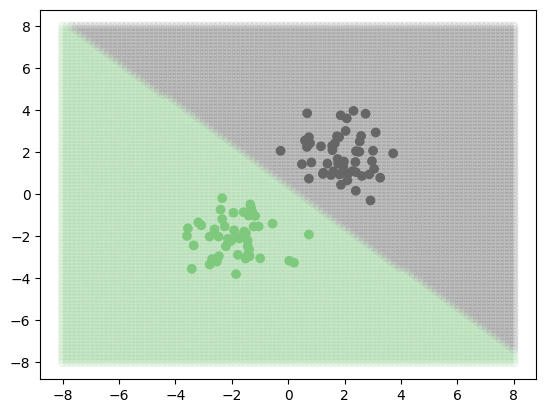

EPOCH 45:
loss = 0.028733165934681892


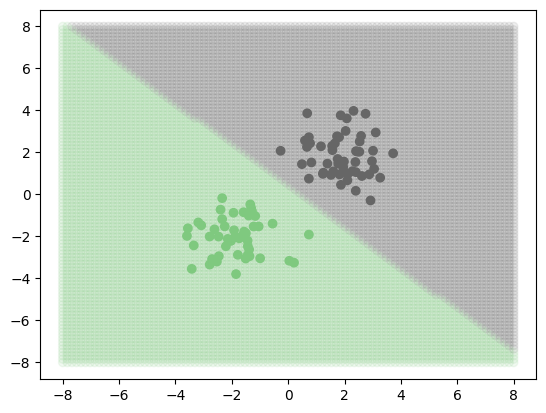

EPOCH 50:
loss = 0.026314925402402878


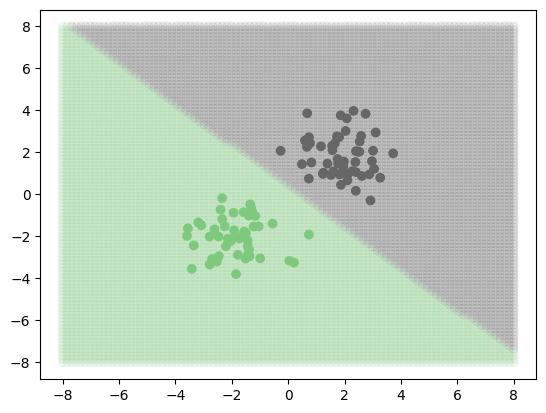

EPOCH 55:
loss = 0.024306083098053932


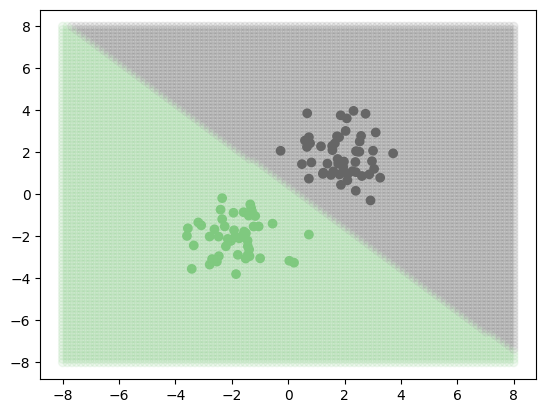

EPOCH 60:
loss = 0.02260853350162506


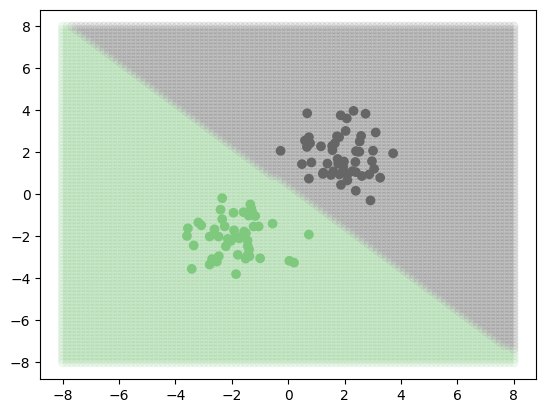

EPOCH 65:
loss = 0.021153468638658524


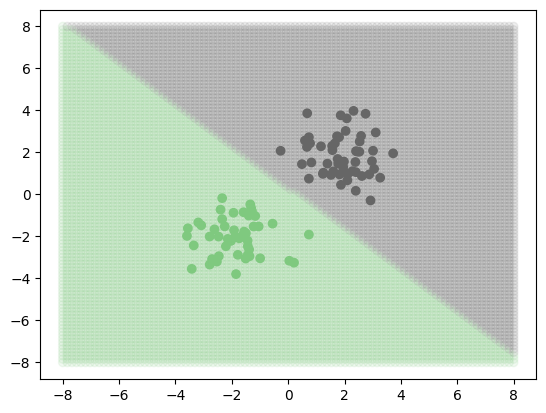

EPOCH 70:
loss = 0.0198911614716053


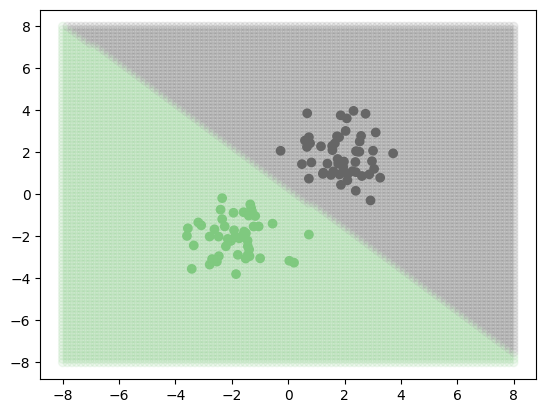

EPOCH 75:
loss = 0.018784748390316963


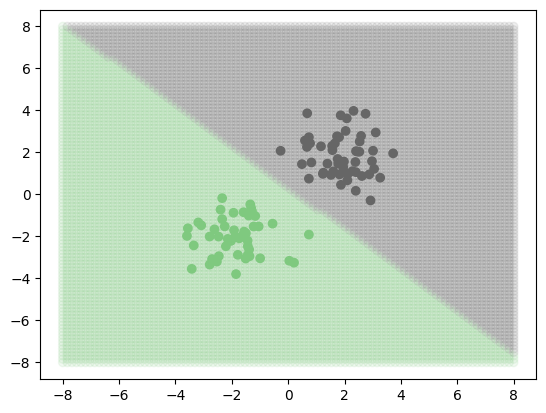

EPOCH 80:
loss = 0.01780630648136139


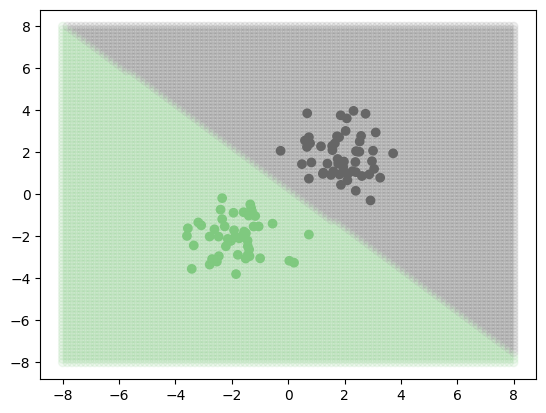

EPOCH 85:
loss = 0.016934260725975037


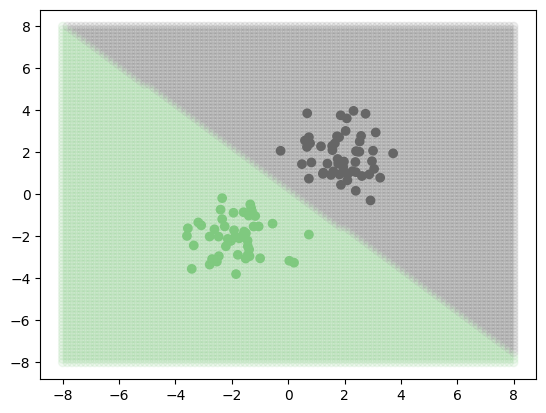

EPOCH 90:
loss = 0.01615169085562229


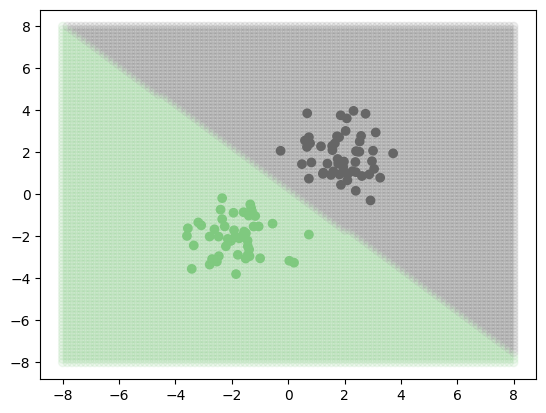

EPOCH 95:
loss = 0.01544511690735817


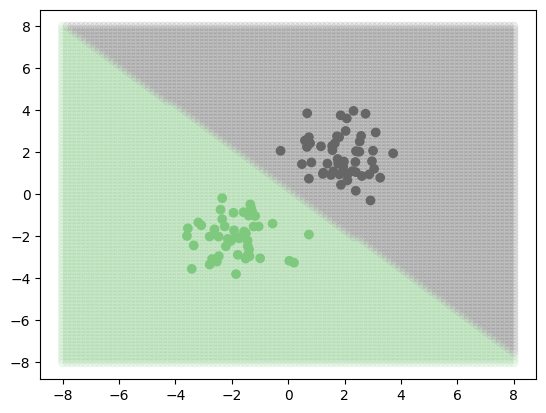

EPOCH 99:
loss = 0.014927203767001629


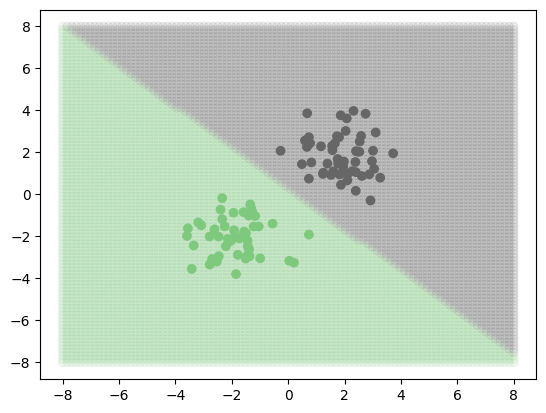

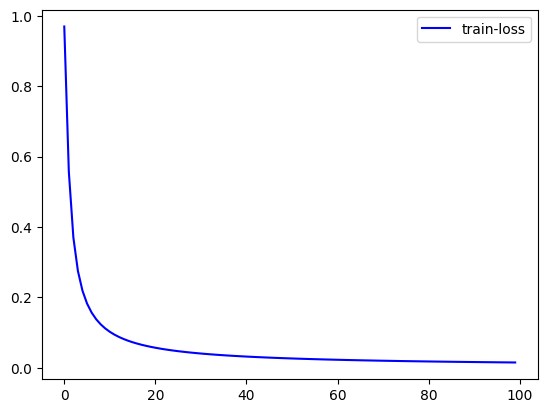

In [35]:
NUM_EPOCHS = 100 # the number of epochs to train our model for
PRINT_EVERY = 5 # output the results every 100th epoch

train_loss = [] # we will store the loss function values at each epoch in this list

optim = GD(model.parameters(), lr=0.1) # we will use the `GD` class you defined in Exercise 1 as our optimiser

for i in range(NUM_EPOCHS):
    output = model(train_data) # run the model over the data to generate the class likelihoods
    
    loss = NLL(output, train_labels) # compute the loss over the current epoch
    
    loss.backward() # perform backprop over the loss to compute the gradients of the parameters
    optim.step()      # run an optimisation step
    model.zero_grad() # reset the gradients, otherwise they will accumulate
    
    train_loss.append(loss.detach().numpy()) # store the loss of the current epoch

    if i % PRINT_EVERY == 0 or i == NUM_EPOCHS - 1: # every once in a while plot the decision boundary and print the loss
        print(f'EPOCH {i}:')
        print(f'loss = {loss.item()}')
        plot_decision(model)
        plot_set(train_data, train_labels)
        plt.show()
        
plot_loss(train_loss, 'train-loss')

As you can see, by using only one layer, the model is unable to learn decision boundaries more complex than a simple line. Therefore given the XOR distribution below, no `OneLayer` model can successfuly learn it.

Note that the XOR distribution is simply formed out of four clusters being assigned 2 different alternating classes.

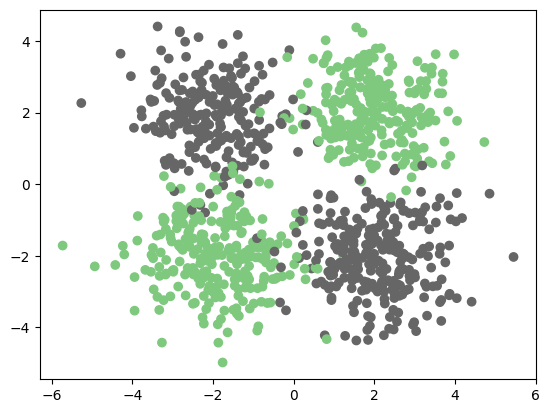

In [36]:
xor = Clusters(mu = [[-2, -2], [2, 2], [-2, 2], [2, -2]],
              sigma = [[1, 1], [1, 1], [1, 1], [1, 1]],
              labels = [0, 0, 1, 1])
xor.plot()

Because the two classes aren't linearly separable, a Neural Network with a single layer won't manage to learn the XOR distribution. But, for fun, let's actually check that this is true, by instantiating one and training it:

EPOCH 0:
loss = 1.0833215713500977


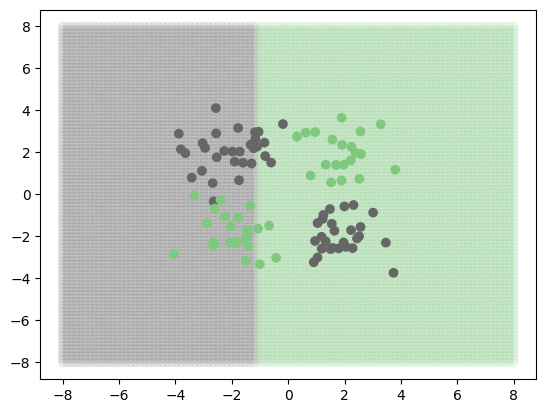

EPOCH 10:
loss = 0.7550985813140869


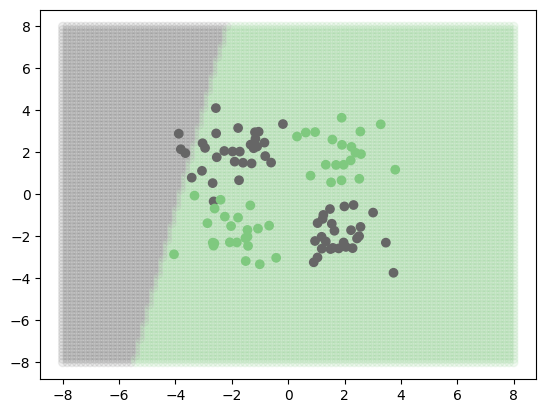

EPOCH 20:
loss = 0.7071423530578613


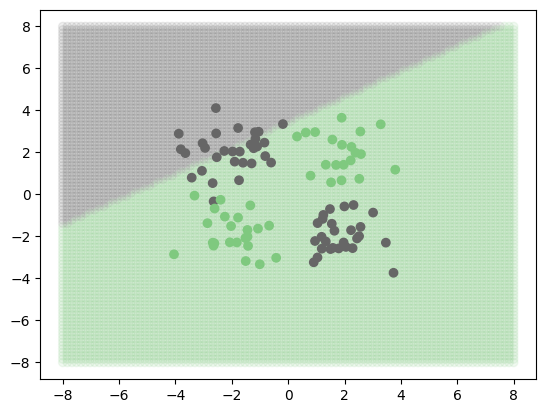

EPOCH 30:
loss = 0.691262423992157


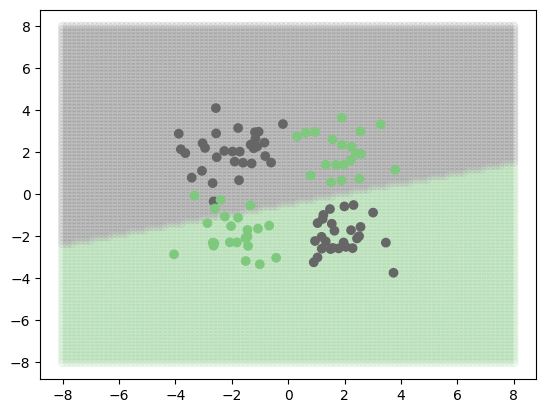

EPOCH 40:
loss = 0.6855165958404541


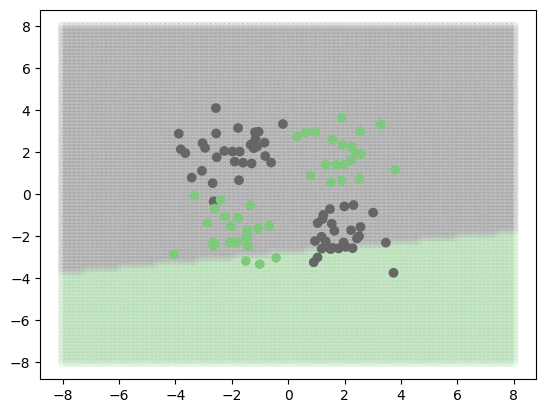

EPOCH 50:
loss = 0.6834263801574707


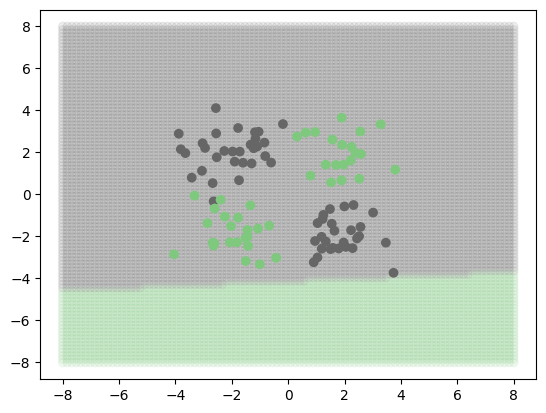

EPOCH 60:
loss = 0.6826624274253845


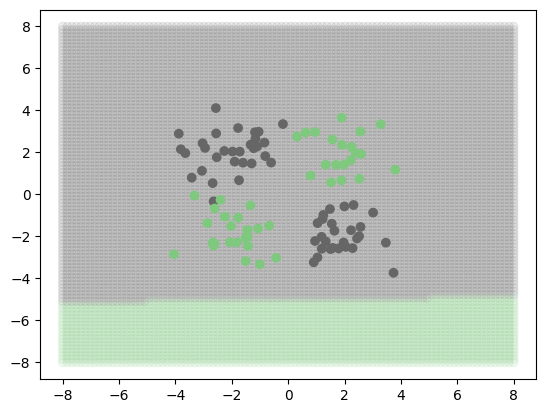

EPOCH 70:
loss = 0.6823820471763611


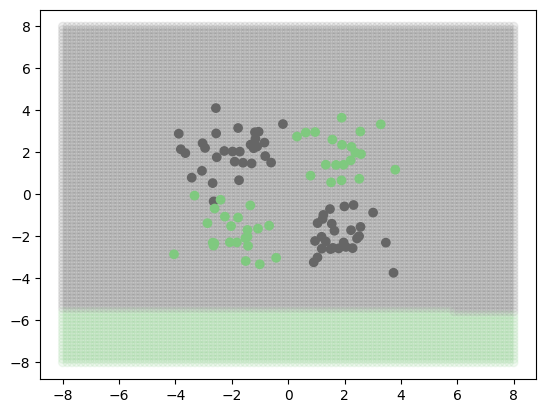

EPOCH 80:
loss = 0.6822788715362549


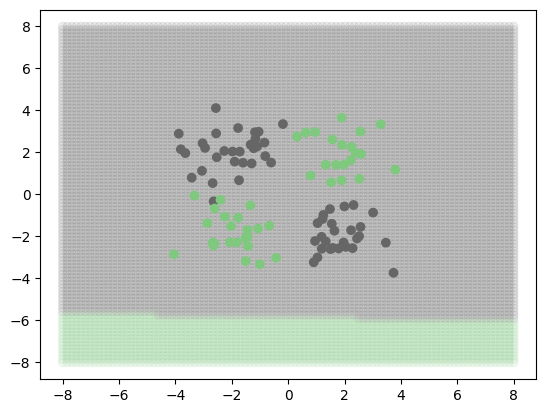

EPOCH 90:
loss = 0.6822408437728882


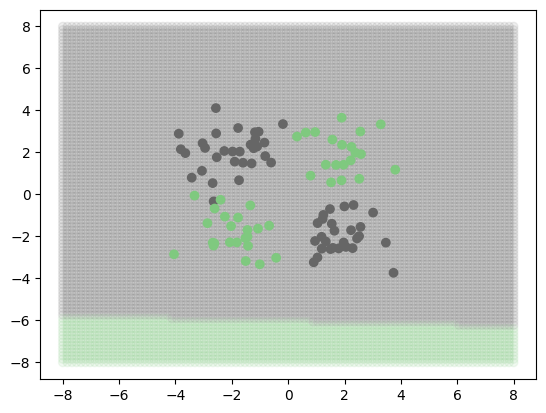

EPOCH 99:
loss = 0.682227611541748


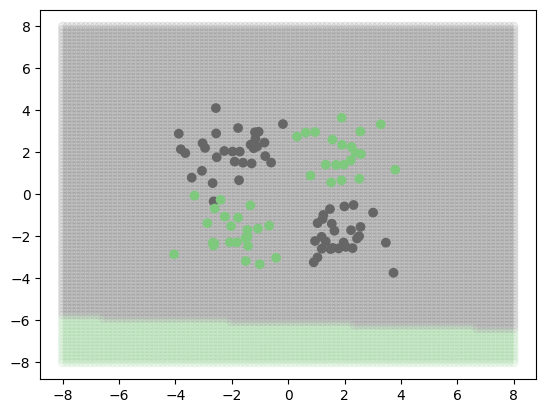

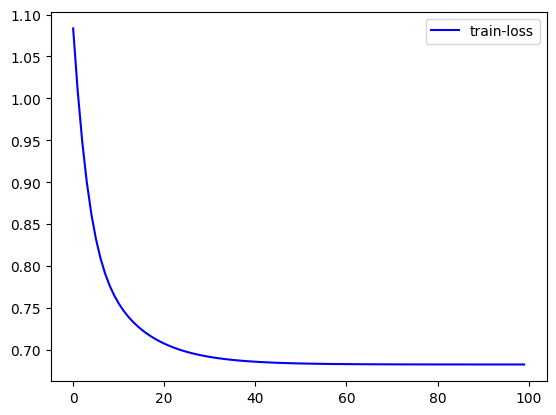

In [37]:
model = OneLayer(2,2)
train_data, train_labels = xor.sample(100) # Let's sample our train data from the XOR distribution

NUM_EPOCHS = 100
PRINT_EVERY = 10

train_loss = []

optim = GD(model.parameters(), lr=0.1)

for i in range(NUM_EPOCHS):
    output = model(train_data)
    
    loss = NLL(output, train_labels)
    
    loss.backward()
    optim.step()
    model.zero_grad()
    
    train_loss.append(loss.detach().numpy())

    if i % PRINT_EVERY == 0 or i == NUM_EPOCHS - 1:
        print(f'EPOCH {i}:')
        print(f'loss = {loss.item()}')
        plot_decision(model)
        plot_set(train_data, train_labels)
        plt.show()
        
plot_loss(train_loss, 'train-loss')

## A closer look at backprop

### Gradients for linear regression
$\newcommand{\w}{\textbf{w}}$
$\newcommand{\x}{\textbf{x}}$
$\newcommand{\W}{\textbf{W}}$
$\newcommand{\X}{\textbf{X}}$
<style>
/* Your CSS rules here */
p {
line-height: 2.6;
}
</style>
We should begin by thinking about what is the gradient for _linear regression_. We can define the model as $\hat{\textbf{y}} = f(\w) = \textbf{X}\w $ and compute the loss $ L(\w, \textbf{y}) = \frac{1}{n} \sum_{i=0}^{n} (y_i - f(\w))^2$, where $n$ represents the length of the training batch (or the entire dataset). Note we use row-major notation for our input matrix.

So, by chain rule we obtain $\dfrac{\partial L}{\partial \w} = \dfrac{\partial L}{\partial f} \cdot \dfrac{\partial f}{\partial \w}$. Computing the gradient $ \dfrac{\partial L}{\partial f}$ is a fairly straightforward manipulation of linear algebra identities and calculus; the more interesting derivative is $\dfrac{\partial f}{\partial \w} = \dfrac{\partial \textbf{X} \w}{\partial \w}$, even if it looks deceivingly simple. Our intuition from low dimensions would have us believe it is $\textbf{X}$, but is that the case? As it turns out, for linear regression this is indeed true. Formally, we are dealing with a function defined as $f: \mathbb{R}^{in} \rightarrow \mathbb{R}^{N}$, so we should expect a gradient of dimension $\mathbb{R}^{N\times in}$, since we need to take the derivative of every output element with respect to every weight in $\w$.

Let's take the first element of the output vector $\hat{\textbf{y}}=\begin{bmatrix}
\hat{y}_1\\
\hat{y}_2\\
... \\
\hat{y}_N
\end{bmatrix}$. The derivative is $\dfrac{\partial \hat{y_1}}{\partial \w} = \dfrac{\partial \x_{1} \w}{\partial \w} = \x_{1}$, by using the properties of dot product derivatives. In the Jacobian, this derivative corresponds to the first row, so this is equivalent to inserting $\x_1$ as a row vector. So, by extrapolating from this we can see that the final result is indeed $\textbf{X}$ . If we look at the shapes of the derivatives, we have $\dfrac{\partial L}{\partial f} \in \mathbb{R}^{N}$ and $\dfrac{\partial \textbf{X} \w}{\partial \w} \in \mathbb{R}^{N\times in}$, so the math does indeed check out (the final shape is $\mathbb{R}^{in}$). All looks fine so far...

### Gradients for neural layers

Since gradients seem to respect our intuitions for linear regression, we should hope that when adding the extra dimensions needed for neural networks, the computations don't get too strange. Well, we can simplify the previous definition of a neural layer at depth $l$ as:
$$f(\W_l) = \X\W_l$$

To keep the notation simple, we have dropped the bias and the non-linear activation, as computing their derivatives is intuitive and holds no additional insight. I have further generalized the definition by considering a matrix $\X$, which in practice corresponds to the mini-batches we use for training. What we will mostly focus on is, just as in the case of linear regression, the $l$-th layer of a network $\dfrac{\partial \X\W_l}{\partial \W_l}$. We can write:

$$ \dfrac{\partial L}{\partial \W_l} = \dfrac{\partial L}{\partial \textbf{O}} \dfrac{\partial \textbf{O}}{\partial \W_l}, \ \text{where} \ \textbf{O} = \X\W_l$$

Neural networks are composed of at least two layers, which means that in general the column dimension of $\textbf{O}$ will be an integer greater than 1, unlike in the case of linear regression. This means that we now have $f: \mathbb{R}^{in \times out} \rightarrow \mathbb{R}^{N \times out}$, but, generalizing from our knowledge of Jacobians and gradients, this would suggest a derivative of dimension ${N \times out} \times in \times out$, or some monstrosity like that. The dimensions seem to check out in the $\dfrac{\partial L}{\partial \W_l}$ expansion, but somehow adding more weight vectors to the computation seems to completely break down our previous intuition. Fortunately, there is a trick we can do to partially recover the result from lower dimensions!

Let's try to keep things simple, so we will consider $N = 1$, i.e. we are training with only one sample. Now, we can define $f: \mathbb{R}^{in \times out} \rightarrow \mathbb{R}^{out}, f(\W) = \x\W$. We can fix $in=2$ and $out=3$, so we can explicitly write:

$$ \x\W = [x_1 \ x_2] \begin{bmatrix}
w_{11} \  w_{12} \ w_{13}\\
w_{21} \ w_{22}  \ w_{23}\\
\end{bmatrix} = [o_1 \ o_2 \ o_3]
$$

For the gradient, we must take each $o_i$ and take its derivative w.r.t all weights in $\W$. For $o_1$, this is:
$$\begin{bmatrix}
\dfrac{\partial o_1}{\partial w_{11}} \  \dfrac{\partial o_1}{\partial w_{12}} \ \dfrac{\partial o_1}{\partial w_{13}}\\\\
\dfrac{\partial o_1}{\partial w_{21}} \ \dfrac{\partial o_1}{\partial w_{22}} \ \dfrac{\partial o_1}{\partial w_{23}}\\
\end{bmatrix} =\begin{bmatrix}
\dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial w_{11}} \  \dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial w_{12}} \ \dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial w_{13}}\\\\
\dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial w_{21}} \ \dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial w_{22}} \ \dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial w_{23}}\\
\end{bmatrix} = \begin{bmatrix}
x_1\  0 \ 0\\
x_2 \ 0 \ 0\\
\end{bmatrix} $$
In fact, we end up with a 3-order tensor that looks like:
$$ \begin{bmatrix} \begin{bmatrix}
x_1\  0 \ 0\\
x_2 \ 0 \ 0\\
\end{bmatrix}, \begin{bmatrix}
0\  x_1 \ 0\\
0 \ x_2 \ 0\\
\end{bmatrix}, \begin{bmatrix}
0\  0 \ x_1\\
0 \ 0 \ x_2\\
\end{bmatrix}
\end{bmatrix}$$

So it seems there might be some structure we can work with! We also know that $\dfrac{\partial L}{\partial \textbf{O}} = [\dfrac{\partial L}{\partial o_1}, \dfrac{\partial L}{\partial o_2}, \dfrac{\partial L}{\partial o_3}] \Rightarrow \dfrac{\partial L}{\partial w_{ij}} = \dfrac{\partial L}{\partial o_1}\dfrac{\partial o_1}{\partial w_{ij}} + \dfrac{\partial L}{\partial o_2}\dfrac{\partial o_2}{\partial w_{ij}} + \dfrac{\partial L}{\partial o_3}\dfrac{\partial o_3}{\partial w_{ij}}$. Fix, for example, $i = 1, j =1$. Then, we know that $\dfrac{\partial o_1}{\partial w_{11}} = x_1, \dfrac{\partial o_2}{\partial w_{11}} = 0, \dfrac{\partial o_3}{\partial w_{11}} = 0 \Rightarrow \dfrac{\partial L}{\partial w_{11}} = \dfrac{\partial L}{\partial o_1}x_1 + \dfrac{\partial L}{\partial o_2}\cdot 0 + \dfrac{\partial L}{\partial o_3}\cdot 0 = \dfrac{\partial L}{\partial o_1}x_1$.

In fact, this can easily be generalized to any $w_{ij}$. We see that we can express:

$$ \dfrac{\partial L}{\partial \W} =  \begin{bmatrix}
\dfrac{\partial L}{\partial w_{11}} \  \dfrac{\partial L}{\partial w_{12}} \ \dfrac{\partial L}{\partial w_{13}}\\\\
\dfrac{\partial L}{\partial w_{21}} \ \dfrac{\partial L}{\partial w_{22}}  \ \dfrac{\partial L}{\partial w_{23}}\\
\end{bmatrix} = \begin{bmatrix}
\dfrac{\partial L}{\partial o_{1}} x_1 \  \dfrac{\partial L}{\partial o_{2}} x_1 \ \dfrac{\partial L}{\partial o_{3}} x_1\\\\
\dfrac{\partial L}{\partial o_{1}} x_2 \ \dfrac{\partial L}{\partial o_{2}} x_2 \ \dfrac{\partial L}{\partial o_{3}} x_2\\
\end{bmatrix} = \begin{pmatrix}
x_1\\
x_2
\end{pmatrix} \cdot [\dfrac{\partial L}{\partial o_1}, \dfrac{\partial L}{\partial o_2}, \dfrac{\partial L}{\partial o_3}] = \x^T \cdot \dfrac{\partial L}{\partial \textbf{O}}$$

Therefore, since we are only interested in updating using the correct values for the gradients, we can define for our purposes that $\dfrac{\partial \textbf{O}}{\partial \W} = \dfrac{\partial \x\W}{\partial \W} = \x^T \cdot \underline{\hphantom{h}}$, where $\underline{\hphantom{h}}$ is usually $\dfrac{\partial L}{\partial \textbf{O}}$, but more generally can be thought of as all the terms in the chain rule encountered up to the current gradient. So, at least for $N=1$, it seems like we can partially recover some of our intuition! Do take in mind that strictly formally speaking, this is **not** the correct definition of the gradient, only a convenient trick for the chain rule. For higher batch dimensions, the proof is mostly the same, but the notation can become a bit more tedious, so we will leave this as an optional exercise for home.

### Gradients for activations.

We are almost done with the necessary theoretical justifications to proceed to the next exercises. We should briefly talk about derivatives with respect to the input features.

As we have previously discussed, for linear models, it doesn't make sense to talk about the derivative w.r.t the input $\x$, as it is not a trainable parameter. However, recall how a neural network with two layers is defined:
$$
   \textbf{Z}_1 = \X\W_{1} + \textbf{b}_{1}\\
   \textbf{O}_1 = \sigma(\textbf{Z}_1) \\
   \textbf{Z}_2 = \textbf{O}_1\W_{2} + \textbf{b}_{2}\\
   \textbf{O}_2 = \sigma(\textbf{Z}_2)
$$

I have introduced the extra $\textbf{Z}$ terms to make the chain rule easier to write down. So, when computing $\dfrac{\partial L}{\partial \W_1}$, by chain rule we get:
$$\dfrac{\partial L}{\partial \W_1} =  \dfrac{\partial L}{\partial \textbf{O}_2} \dfrac{\partial \textbf{O}_2}{\partial \textbf{Z}_2} \dfrac{\partial \textbf{Z}_2}{\partial \textbf{O}_1} \dfrac{\partial \textbf{O}_1}{\partial \textbf{Z}_1} \dfrac{\partial \textbf{Z}_1}{\partial \W_1} $$

Don't worry, we won't compute all these gradients. We are only interested in the peculiar $\dfrac{\partial \textbf{Z}_2}{\partial \textbf{O}_1} = \dfrac{\partial \textbf{O}_1\W_{2} + \textbf{b}_{2}}{\partial \textbf{O}_1} = \dfrac{\partial \textbf{O}_1\W_{2}}{\partial \textbf{O}_1} $. Have you noticed? We are taking the derivative w.r.t the input to this layer, and in this case it makes complete sense. There is no other way we could reach the weights of $\W_1$ by chain rule.

As for the value of the derivative itself, let's go back to our  $N = 1, in=2, out=3$ example. If you think about it, this is a $f: \mathbb{R}^{2} \rightarrow \mathbb{R}^{3}$ function, so we already know the derivative will be a Jacobian of dimension $3 \times 2$. We can write it down as:
$$\dfrac{\partial \x\W}{\partial \x}=\begin{bmatrix}
\dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial x_1} \  \dfrac{\partial x_1w_{11}+x_2w_{21}}{\partial x_2} \\\\
\dfrac{\partial x_1w_{12}+x_2w_{22}}{\partial x_1} \  \dfrac{\partial x_1w_{12}+x_2w_{22}}{\partial x_2} \\\\
\dfrac{\partial x_1w_{13}+x_2w_{23}}{\partial x_1} \  \dfrac{\partial x_1w_{13}+x_2w_{23}}{\partial x_2}
\end{bmatrix} =  \begin{bmatrix}
w_{11} \  w_{21}\\\\
w_{12} \  w_{22} \\\\
w_{13} \  w_{23}
\end{bmatrix} = \W^T$$

As you can see, this particular derivative works much nicer with our intuition from lower dimensions, having essentially almost the exact form we'd expect (with an extra transposition). Just as in the earlier case, we will leave the generalization to $\X$ as an optional exercise for home.

Having all this theory cleared, we can finally write our own backpropagation algorithm!

### Writing our own differentiation system

For the purpose of this lab, we will write our own differentiation system, to get a more hands-on picture on how gradient descent works. In practice, we almost always work with predefined frameworks (such as Pytorch), however having a high-level view of what's going on under the hood can always come in handy, especially in a field like Deep Learning.

We will define some simple rules for our system:
- all layers will implement a `forward` and `backward` method for their respective passes
- for a given layer, `backward` will take as input the gradient w.r.t the outputs and return the gradient with respect to the input data if specified
- calling `backwards` on our loss will begin the chain rule computation

In [38]:
from typing import Any

class LinearLayer():
  """
  Simple affine transformation
  """
  def __init__(self,
               input_size: int,
               output_size: int):

      # randomly initialise the weights with samples from a Gaussian distribution
      self._w = nn.Parameter(torch.randn([input_size, output_size]))

      # ... and the biases with zeros
      self._b = nn.Parameter(torch.zeros([output_size]))

      self._params = [self._w, self._b]


  def forward(self, x: torch.Tensor) -> torch.Tensor:
    self._layer_input = x.clone() # we need to save the input for the backwards pass, when computing the gradient wrt the weights

    # basic affine transformation
    output = x @ self._w + self._b
    return output

  def __call__(self, x):
     return self.forward(x)

  def backward(self, grad_output, return_grad_input=False):

    """
    Let's analyze how we can write the chain rule for a simple linear layer:
      - for the input, remember: dO/dI = W^T, so  we just multiply grad_output=dL/dO * W^T
      - for the weights W, remember the formula: dL/dW = X^T * dL/dO.
      - finally, the gradient for the bias is relatively simple: dO/dB = dXW+B/dB = dB/dB = I_n, so multiplied by dL/dO it is exactly dL/dO. we take the sum to account for the influence of each sample in the batch
    """
    grad_input = None

    if return_grad_input:
      grad_input = torch.matmul(grad_output, self._w.t())

    self._w.grad = torch.matmul(self._layer_input.t(), grad_output)
    self._b.grad = grad_output.sum(0)

    return grad_input

  def zero_grad(self):
      """Reset the gradients of the parameters"""
      for param in self._params:
          if param.grad is not None:
              param.grad.zero_()

In [39]:
import torch.nn.functional as F

class NLLLoss():
    def __init__(self, model, num_cls):
        self.model = model
        self.num_cls = num_cls
        self._batch_outputs = []

    def __call__(self, output: torch.Tensor, true_labels: torch.Tensor) -> torch.Tensor:
      """
      Given the predictions of the neural network and the ground truth data,
      compute the negative log-likelihood.
      Arguments:
        output: output of neural network, tensor of size N x 2
        true_labels: ground truth data, Tensor of size N
      """
      # get the likelihoods of the correct class for all predictions
      self._true_labels = true_labels
      self._batch_outputs = output.clone()
      likelihood = output.gather(1, true_labels.view(-1,1))

      # calculate the mean of loss
      loss = -torch.log(likelihood)
      loss = torch.mean(loss)

      return loss

    def backward(self):
      """
      We will use a computational trick to get the derivatives w.r.t. the pre-softmax activations.
      """
      loss_grad = 1/len(self._batch_outputs) * (self._batch_outputs - F.one_hot(self._true_labels, num_classes=self.num_cls))
      return self.model.backward(loss_grad)


# functional implementation for pytorch
def NLL(output: torch.Tensor, true_labels: torch.Tensor) -> torch.Tensor:
    """
    Given the predictions of the neural network and the ground truth data,
    compute the negative log-likelihood.
    Arguments:
      output: output of neural network, tensor of size N x 2
      true_labels: ground truth data, Tensor of size N
    """
    # get the likelihoods of the correct class for all predictions
    likelihood = output.gather(1, true_labels.view(-1,1))

    # calculate the mean of loss
    loss = -torch.log(likelihood)
    loss = torch.mean(loss)

    return loss

## Exercise 2: Learning the XOR distribution
Given the XOR distribution above, and keeping the `OneLayer` skeleton in mind, define a multi-layer feed-forward network that is capable of learning the XOR distribution and then train it, plotting the decision boundary and the evolution of the loss over the epochs.

In [40]:
from typing import Any

class MultiLayer():
  """Multi-Layer Neural Network (2 layers)"""
  def __init__(self,
               input_size: int,
               hidden_size: int,
               output_size: int,):
      """
      TODO: initialize weights and biases for the hidden and the output layers
      Arguments:
        input_size: number of input neurons
        hidden_size: number of neurons of hidden layer
        output_size: number of neurons of output layer
      """
      super().__init__()

      # Now we'll have two sets of weights and biases, corresponding to two layers
      # 1st layer
      self._l1 = LinearLayer(input_size, hidden_size)

      # 2nd layer
      self._l2 = LinearLayer(hidden_size, output_size)

      self._params = [self._l1._w, self._l2._w, self._l1._b, self._l2._b]

      self._hidden_activation_fn = nn.Tanh()
      self._output_activation_fn = nn.Softmax(dim=-1)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
      """
      Feedforward through the two layers.
      Arguments:
        x: tensor of size (number_of_examples x self.input_size)

      Returns a tensor of size self.output_size, which is the output of the
      network after the softmax activation.
      """
      # Layer 1
      z1 = self._l1(x)
      o1 = self._hidden_activation_fn(z1)
      self._o1 = o1

      # Layer 2
      z2 = self._l2(o1)
      o2 = self._output_activation_fn(z2)

      return o2

  def __call__(self, x):
      return self.forward(x)

  def parameters(self):
      return self._params

  def backward(self, loss_grad):
     # the loss we get is dL/dZ2, so we can go straight to computing dL/dW2
     # we also need dL/dO1 for the chain rule further down
     grad_o1 = ... # dL/dW2 = dL/dZ2 * dZ2/dW2

     # the gradient for activation functions is generally easy, since most activation functions are defined at matrix element-level
     # therefore, good old highschool calculus is enough, and pytorch has good support for operating at element level
     # we use tanh, which has the nice derivative tanh(x)' = 1 - tanh(x)^2
     grad_z1 = ... # o1 = t(z1) => t(z1)' = 1 - t(z1)^2

     # once again, we delegate the backwards to the first linear layer
     # this time, we do not use the input gradients, since there is no other layer to propagate the gradients to
     grad_o1 = self._l2.backward(loss_grad, return_grad_input=True) # dL/dW2 = dL/dZ2 * dZ2/dW2

     # the gradient for activation functions is generally easy, since most activation functions are defined at matrix element-level
     # therefore, good old highschool calculus is enough, and pytorch has good support for operating at element level
     # we use tanh, which has the nice derivative tanh(x)' = 1 - tanh(x)^2
     grad_z1 = 1 - self._o1 ** 2 # o1 = t(z1) => t(z1)' = 1 - t(z1)^2

     # once again, we delegate the backwards to the first linear layer
     # this time, we do not use the input gradients, since there is no other layer to propagate the gradients to
     self._l1.backward(grad_o1 * grad_z1) # dL/dW1 = dL/dO1 * dO1/dZ1 * dZ1/dW1, Z1 = XW1


  def zero_grad(self):
      """Reset the gradients of the parameters"""
      for param in self._params:
          if param.grad is not None:
              param.grad.zero_()

In [41]:
# We need to perform Gradient Descent on 2 layers now, so let's redefine our `GD` class
class GD:
  def __init__(self, params: torch.Tensor, lr: int):
    self.w1, self.w2, self.b1, self.b2 = list(params)
    self.lr = lr

  def step(self):
    with torch.no_grad():
      self.w1 -= self.lr * self.w1.grad
      self.b1 -= self.lr * self.b1.grad
      self.w2 -= self.lr * self.w2.grad
      self.b2 -= self.lr * self.b2.grad

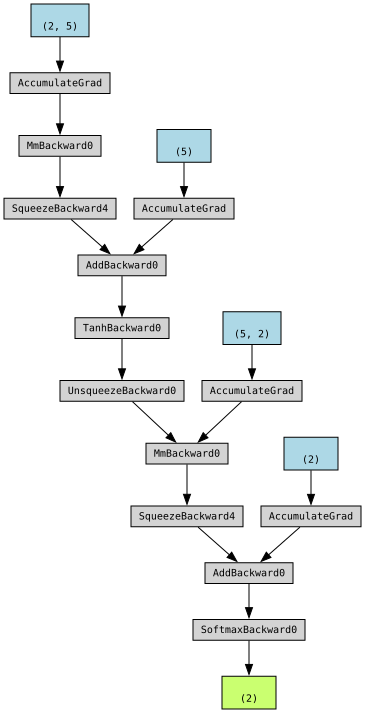

In [42]:
# For fun, use `torchviz.make_dot()` to see the computation graph of the network
INPUT_SIZE = 2
HIDDEN_SIZE = 5
OUTPUT_SIZE = 2
x = torch.randn(INPUT_SIZE)
model = MultiLayer(input_size=INPUT_SIZE, 
                   hidden_size=HIDDEN_SIZE,
                   output_size=OUTPUT_SIZE)
torchviz.make_dot(model(x))

EPOCH 0:
loss = 0.8250975012779236


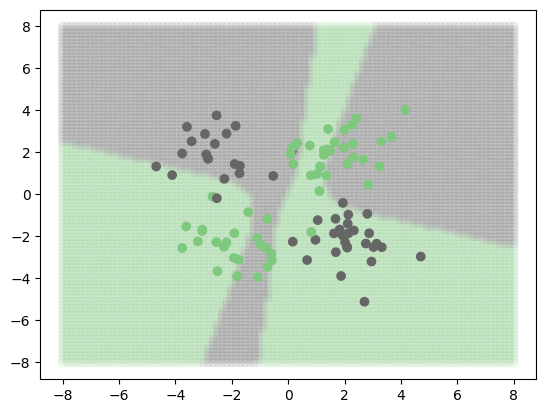

EPOCH 100:
loss = 0.3939204812049866


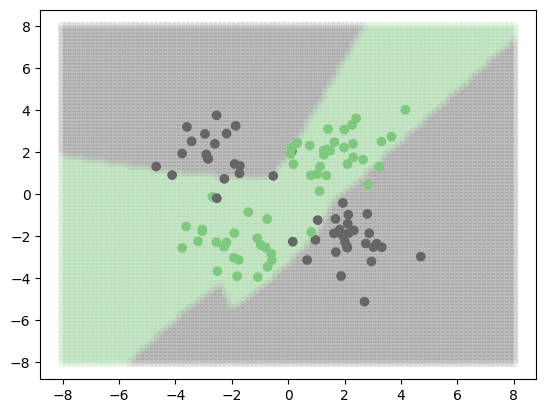

EPOCH 200:
loss = 0.2552586495876312


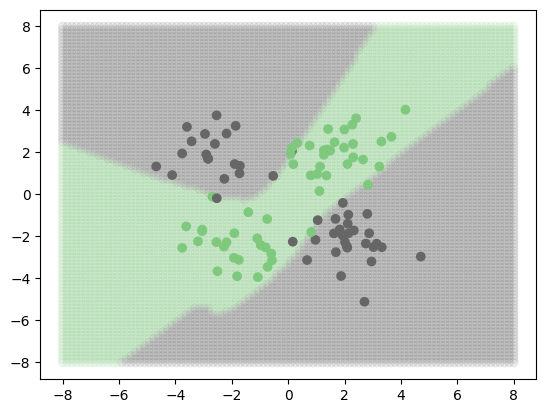

EPOCH 300:
loss = 0.18558542430400848


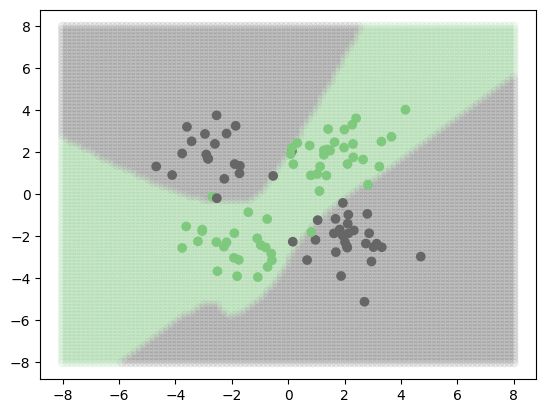

EPOCH 399:
loss = 0.15385349094867706


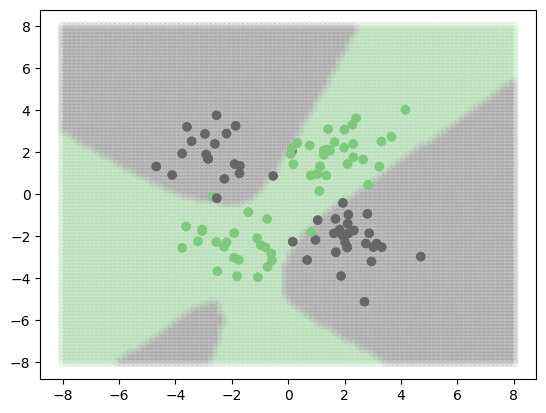

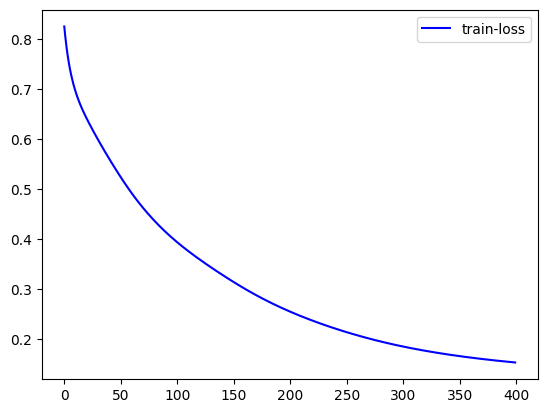

In [43]:
# Finally, train the network and plot the decision boundaries
model = MultiLayer(input_size=INPUT_SIZE, 
                   hidden_size=HIDDEN_SIZE,
                   output_size=OUTPUT_SIZE)
train_data, train_labels = xor.sample(100) # Let's sample our train data from the XOR distribution

NUM_EPOCHS = 400
PRINT_EVERY = 100

train_loss = []

optim = GD(model.parameters(), lr=0.1)

for i in range(NUM_EPOCHS):
    output = model(train_data)
    loss = NLL(output, train_labels)
    
    loss.backward()
    optim.step()
    model.zero_grad()
    
    train_loss.append(loss.detach().numpy())

    if i % PRINT_EVERY == 0 or i == NUM_EPOCHS - 1:
        print(f'EPOCH {i}:')
        print(f'loss = {loss.item()}')
        plot_decision(model)
        plot_set(train_data, train_labels)
        plt.show()
        
plot_loss(train_loss, 'train-loss')

## Exercise 3: Learning the two moons dataset

The two moons dataset is another classic example of a non-linear dataset. While the training code is pretty similar to the previous XOR example, it's good practice for getting used to Pytorch, and the training visualization is arguably prettier.

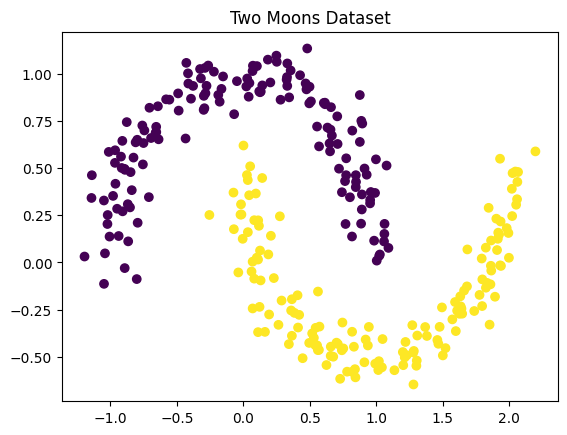

In [44]:
from sklearn.datasets import make_moons
X, y = make_moons(n_samples=300, noise=0.1)

plt.scatter(X[:, 0], X[:, 1], c=y)  # data points, color-coded by labels
plt.title("Two Moons Dataset")
plt.show()

Finally, let's create a train dataset and a validation dataset:

In [45]:
train_data, train_labels = torch.from_numpy(X).float(), torch.from_numpy(y).long()

vX, vy = make_moons(n_samples=300, noise=0.1)
val_data, val_labels = torch.from_numpy(vX).float(), torch.from_numpy(vy).long()

You should:
1. Define the Neural Network, inheriting `torch.nn.Module` and using all the appropriate objects provided by torch. You can use one of the loss functions already provided by `torch.nn.functional` [[5]](https://pytorch.org/docs/stable/nn.functional.html);
2. For fun, plot the computation graph;
3. Train the network like before, printing the loss and decision boundary from time to time. For now, you can use the `torch.optim.SGD` optimiser [[6]](https://pytorch.org/docs/stable/optim.html#torch.optim.SGD);
4. Take a sample from the distribution and use it as a validation dataset, testing the loss function on it without training every epoch. Plot both losses;
5. (Optional) Use the previously defined custom layers and gradient computations and notice the differences at train time (if any appear).

In [50]:
class TwoMoonNN(nn.Module):
    def __init__(self,
                 input_size: int,
                 hidden_size: int,
                 output_size: int,
                 hidden_activation_fn = nn.ReLU()):
        # Initialise the base class (nn.Module)
        super().__init__()
        self.l1 = nn.Linear(in_features=input_size,
                            out_features=hidden_size,
                            bias=True)
        self.l2 = nn.Linear(in_features=hidden_size,
                            out_features=output_size,
                            bias=False)
        self.act_fn = hidden_activation_fn

    def forward(self, x):
        h = self.act_fn(self.l1(x))
        out = self.l2(h)

        return out

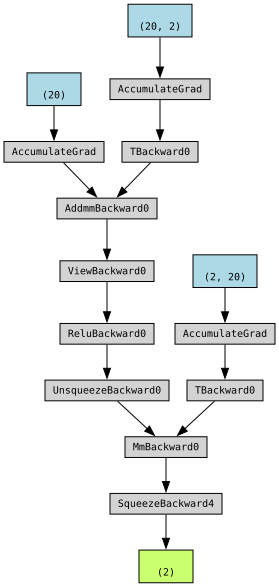

In [51]:
# For fun, use `torchviz.make_dot()` to see the computation graph of the network
model = TwoMoonNN(2, 20, 2)
x = torch.randn(2)
torchviz.make_dot(model(x))

In [55]:
def plot_decision(model: nn.Module, bounds: list = [-8, 8, -8, 8],
                  detail: int = 100, two_moons=False):
    """Plot the decision boundary of the `model`"""

    # Get all the points in the region we want to plot

    # threshold boundaries for two moons
    if two_moons:
      bounds[0] = max(bounds[0], -2)
      bounds[1] = min(bounds[1], 3)
      bounds[2] = max(bounds[2], -2)
      bounds[3] = min(bounds[3], 3)
    x1, x2 = torch.meshgrid(torch.linspace(bounds[0], bounds[1], detail),
                            torch.linspace(bounds[2], bounds[3], detail))

    data = torch.cat((x1.contiguous().view(-1, 1), x2.contiguous().view(-1, 1)),
                     dim=1)

    # use the model to predict the class of every point
    labels = torch.argmax(model(data), dim=-1)

    # plot all of the points
    plot_set(data, labels, alpha=0.1)

def plot_loss(loss: list, label: str, color: str = 'blue'):
    """Plot the evolution of the loss function"""
    plt.plot(loss, label=label, color=color)
    plt.legend()

EPOCH 0:
loss = 0.6603052020072937


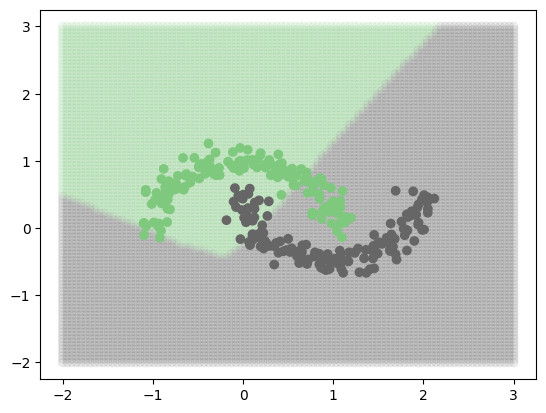

EPOCH 50:
loss = 0.24081265926361084


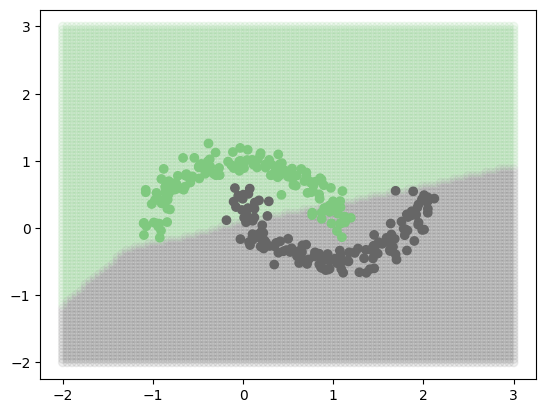

EPOCH 100:
loss = 0.2167932093143463


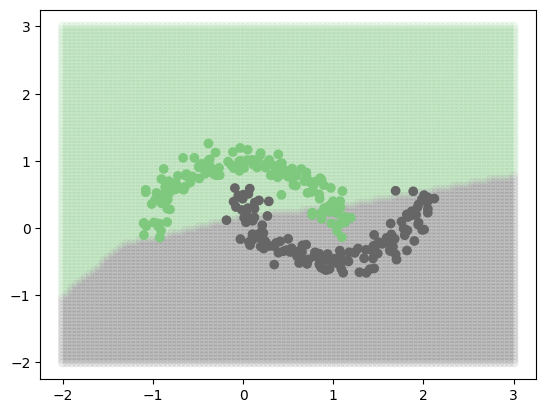

EPOCH 150:
loss = 0.19945071637630463


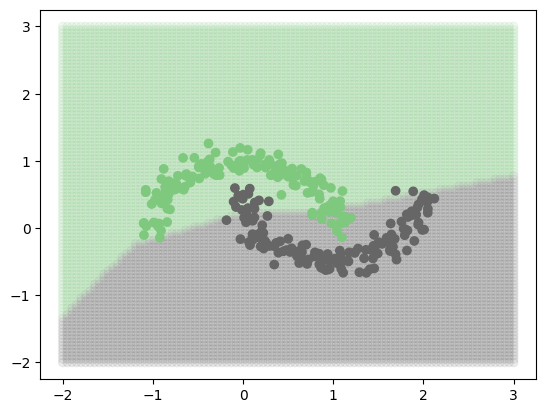

EPOCH 200:
loss = 0.17860344052314758


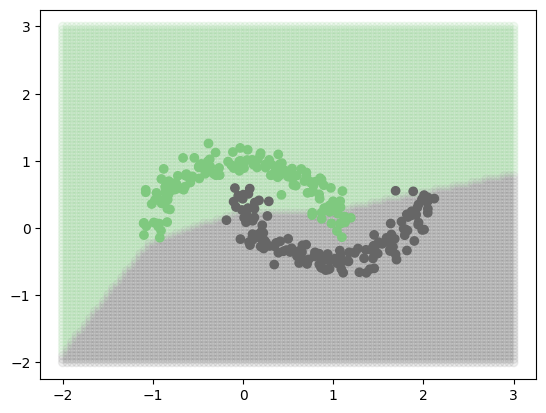

EPOCH 250:
loss = 0.1543838381767273


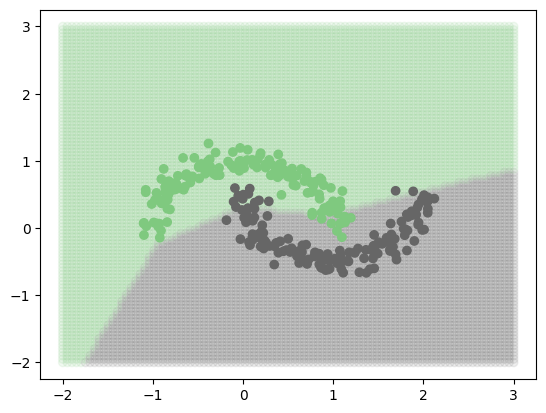

EPOCH 300:
loss = 0.12896473705768585


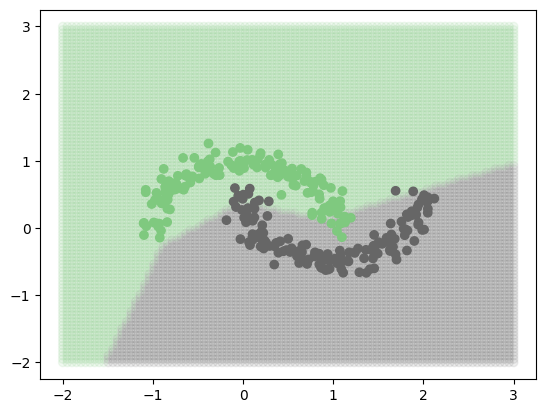

EPOCH 350:
loss = 0.10499094426631927


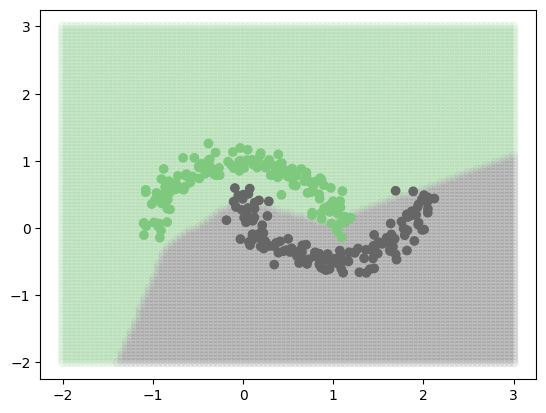

EPOCH 400:
loss = 0.08462890982627869


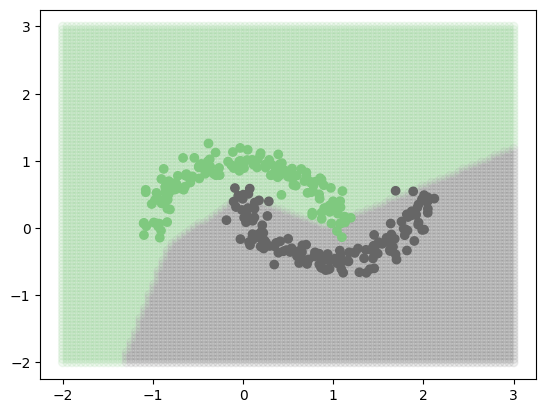

EPOCH 450:
loss = 0.06844975054264069


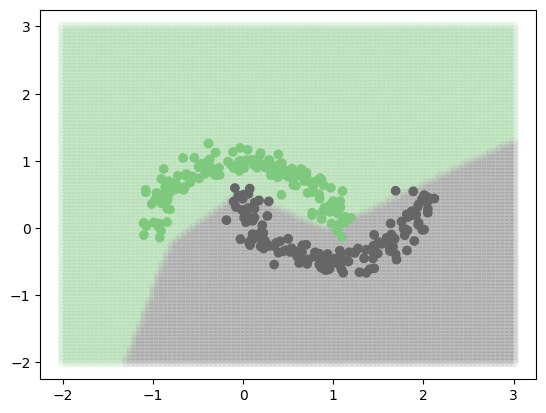

EPOCH 500:
loss = 0.05611412227153778


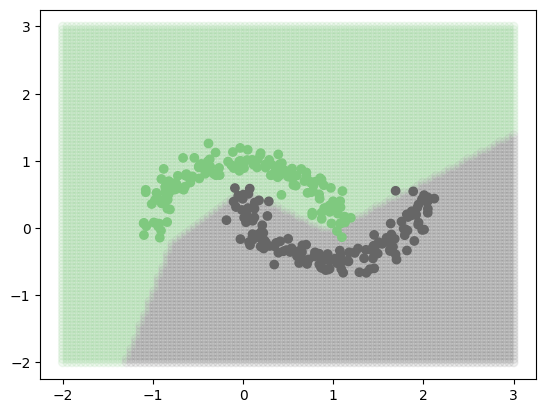

EPOCH 550:
loss = 0.04676251485943794


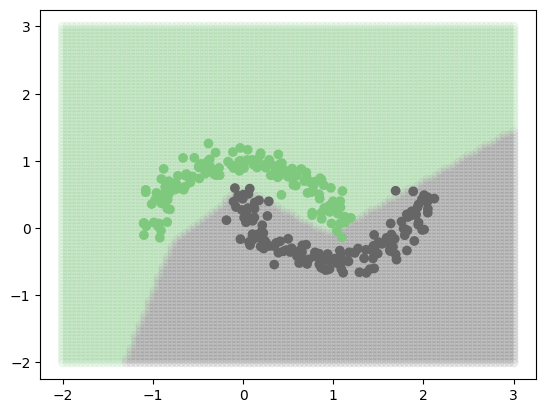

EPOCH 600:
loss = 0.03967386111617088


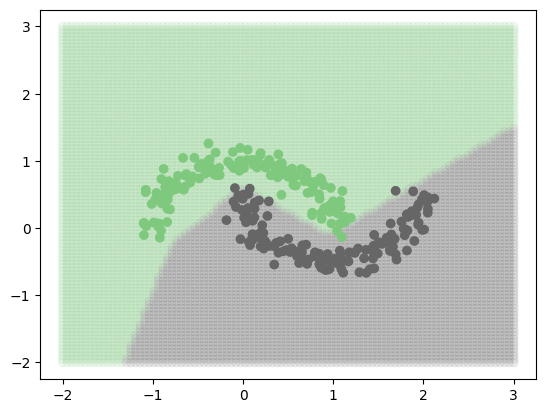

EPOCH 650:
loss = 0.03421822190284729


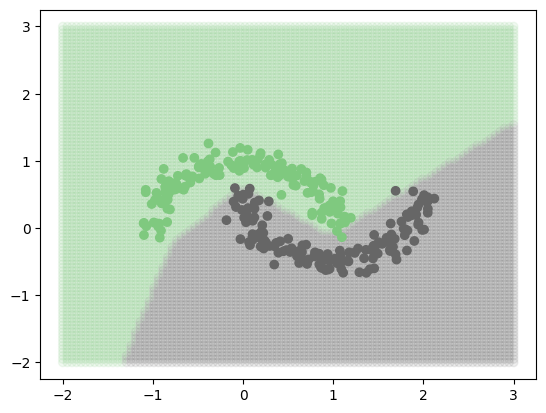

EPOCH 700:
loss = 0.02994805946946144


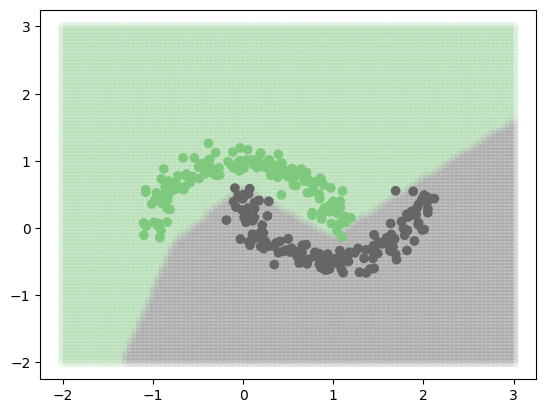

EPOCH 750:
loss = 0.02653135173022747


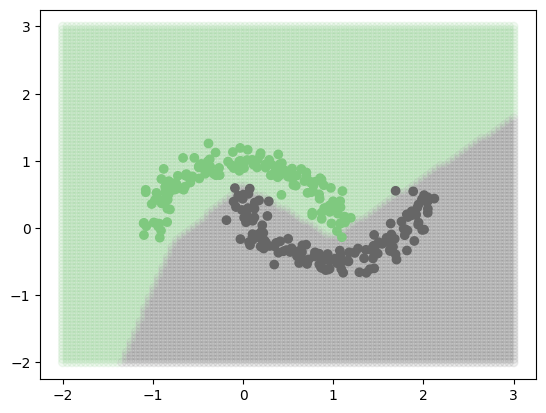

EPOCH 800:
loss = 0.02375379577279091


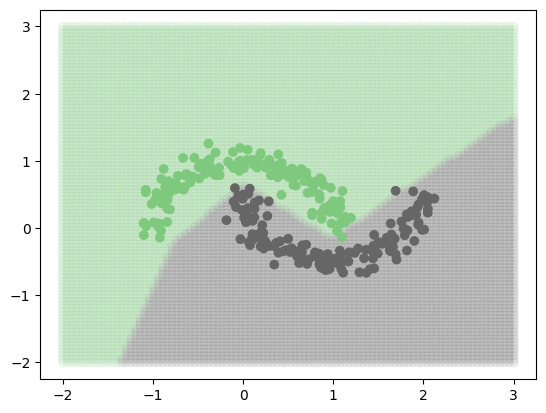

EPOCH 850:
loss = 0.02148541621863842


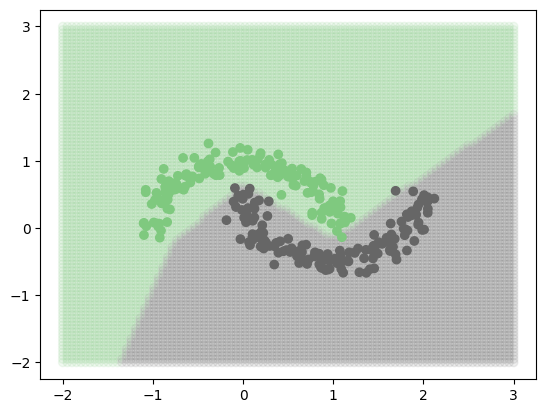

EPOCH 900:
loss = 0.01959131844341755


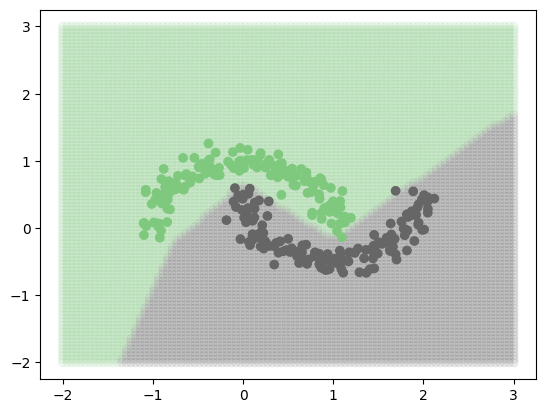

EPOCH 950:
loss = 0.017987946048378944


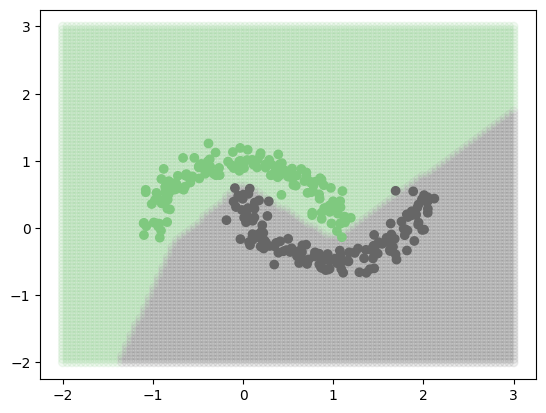

EPOCH 999:
loss = 0.01664144918322563


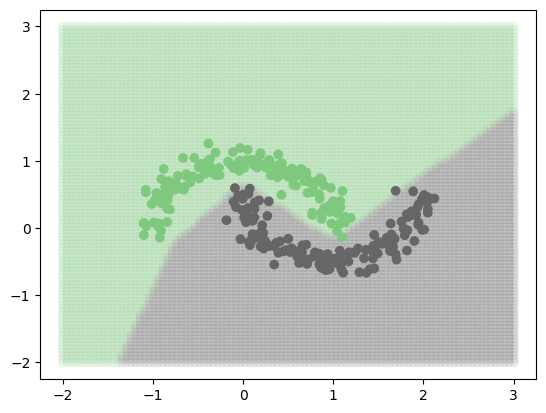

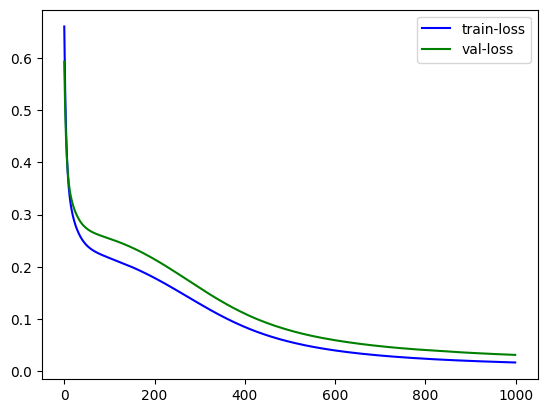

In [56]:
# Finally, train the network and plot the decision boundaries
model = TwoMoonNN(2, 20, 2)
# model = MultiLayer(2, 10, 2)

NUM_EPOCHS = 1000
PRINT_EVERY = 50

train_loss = []
val_loss = [] # This time we will track the loss on val_data

# TODO: instantiante SGD optimizer
# look up the Pytorch documentation:
# https://pytorch.org/docs/stable/optim.html?highlight=sgd#torch.optim.SGD
optim = torch.optim.SGD(model.parameters(), lr=0.3)

# TODO: instantiate the Cross Entropy loss
# look up the Pytorch documentation:
# https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html
criterion = nn.CrossEntropyLoss()
# criterion = NLLLoss(model, num_cls=2)

for i in range(NUM_EPOCHS):
    # Set the model to train mode and reset the gradients
    # model.train()
    optim.zero_grad()

    output = model(train_data)

    # The main difference between Cross Entropy and NLL is that the first doesn't
    # expect the output to be class likelihoods (\in [0, 1]), but rather
    # class scores (\in \mathbb{R}). That's why we didn't use softmax this time
    # on the last layer.
    loss = criterion(output, train_labels)

    loss.backward()
    optim.step()

    train_loss.append(loss.detach().numpy())

    if i % PRINT_EVERY == 0 or i == NUM_EPOCHS - 1:
        print(f'EPOCH {i}:')
        print(f'loss = {loss.item()}')
        plot_decision(model, two_moons=True)
        #plot_set(train_data, train_labels)
        plot_set(val_data, val_labels)
        plt.show()

    # Every epoch, let's evaluate our model on the validation data and plot both losses at the end
    # model.eval() # set the model to evaluation mode
    with torch.no_grad():
        output = model(val_data)
        validation_loss = criterion(output, val_labels)
        val_loss.append(validation_loss)

plot_loss(train_loss, 'train-loss')
plot_loss(val_loss, 'val-loss', color='green')